In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats as scipy_stats
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import warnings
from typing import Dict, List, Any 
from sklearn.model_selection import GridSearchCV
from pathlib import Path
warnings.filterwarnings('ignore')
import os
from pathlib import Path


# Load BASELINE datasets
df_baseline_iowait = pd.read_csv("baseline/cpu_iowait.csv")
df_baseline_irq = pd.read_csv("baseline/cpu_irq.csv")
df_baseline_system_msec = pd.read_csv("baseline/cpu_system_msec.csv")
df_baseline_user_msec = pd.read_csv("baseline/cpu_user_msec.csv")
df_baseline_util_per = pd.read_csv("baseline/cpu_util_per.csv")

# Load CPU STRESS datasets
df_cpustress_iowait = pd.read_csv("cpu stress/cpu_iowait.csv")
df_cpustress_irq = pd.read_csv("cpu stress/cpu_irq.csv")
df_cpustress_system_msec = pd.read_csv("cpu stress/cpu_system_msec.csv")
df_cpustress_user_msec = pd.read_csv("cpu stress/cpu_user_msec.csv")
df_cpustress_util_per = pd.read_csv("cpu stress/cpu_util_per.csv")

# Load DELAY datasets
df_delay_iowait = pd.read_csv("delay/cpu_iowait.csv")
df_delay_irq = pd.read_csv("delay/cpu_irq.csv")
df_delay_system_msec = pd.read_csv("delay/cpu_system_msec.csv")
df_delay_user_msec = pd.read_csv("delay/cpu_user_msec.csv")
df_delay_util_per = pd.read_csv("delay/cpu_util_per.csv")

# Load MEM STRESS datasets
df_memstress_iowait = pd.read_csv("mem stress/cpu_iowait.csv")
df_memstress_irq = pd.read_csv("mem stress/cpu_irq.csv")
df_memstress_system_msec = pd.read_csv("mem stress/cpu_system_msec.csv")
df_memstress_user_msec = pd.read_csv("mem stress/cpu_user_msec.csv")
df_memstress_util_per = pd.read_csv("mem stress/cpu_util_per.csv")

# Load NET LOSS datasets
df_netloss_iowait = pd.read_csv("netloss/cpu_iowait.csv")
df_netloss_irq = pd.read_csv("netloss/cpu_irq.csv")
df_netloss_system_msec = pd.read_csv("netloss/cpu_system_msec.csv")
df_netloss_user_msec = pd.read_csv("netloss/cpu_user_msec.csv")
df_netloss_util_per = pd.read_csv("netloss/cpu_util_per.csv")


# Add source labels - BASELINE
df_baseline_iowait["source"] = "BASELINE"
df_baseline_irq["source"] = "BASELINE"
df_baseline_system_msec["source"] = "BASELINE"
df_baseline_user_msec["source"] = "BASELINE"
df_baseline_util_per["source"] = "BASELINE"

# Add source labels - CPU STRESS
df_cpustress_iowait["source"] = "CPU_STRESS"
df_cpustress_irq["source"] = "CPU_STRESS"
df_cpustress_system_msec["source"] = "CPU_STRESS"
df_cpustress_user_msec["source"] = "CPU_STRESS"
df_cpustress_util_per["source"] = "CPU_STRESS"

# Add source labels - DELAY
df_delay_iowait["source"] = "DELAY"
df_delay_irq["source"] = "DELAY"
df_delay_system_msec["source"] = "DELAY"
df_delay_user_msec["source"] = "DELAY"
df_delay_util_per["source"] = "DELAY"

# Add source labels - MEM STRESS
df_memstress_iowait["source"] = "MEM_STRESS"
df_memstress_irq["source"] = "MEM_STRESS"
df_memstress_system_msec["source"] = "MEM_STRESS"
df_memstress_user_msec["source"] = "MEM_STRESS"
df_memstress_util_per["source"] = "MEM_STRESS"

# Add source labels - NET LOSS
df_netloss_iowait["source"] = "NET_LOSS"
df_netloss_irq["source"] = "NET_LOSS"
df_netloss_system_msec["source"] = "NET_LOSS"
df_netloss_user_msec["source"] = "NET_LOSS"
df_netloss_util_per["source"] = "NET_LOSS"


# Convert to datetime - BASELINE
df_baseline_iowait["Time"] = pd.to_datetime(df_baseline_iowait["Time"])
df_baseline_irq["Time"] = pd.to_datetime(df_baseline_irq["Time"])
df_baseline_system_msec["Time"] = pd.to_datetime(df_baseline_system_msec["Time"])
df_baseline_user_msec["Time"] = pd.to_datetime(df_baseline_user_msec["Time"])
df_baseline_util_per["Time"] = pd.to_datetime(df_baseline_util_per["Time"])

# Convert to datetime - CPU STRESS
df_cpustress_iowait["Time"] = pd.to_datetime(df_cpustress_iowait["Time"])
df_cpustress_irq["Time"] = pd.to_datetime(df_cpustress_irq["Time"])
df_cpustress_system_msec["Time"] = pd.to_datetime(df_cpustress_system_msec["Time"])
df_cpustress_user_msec["Time"] = pd.to_datetime(df_cpustress_user_msec["Time"])
df_cpustress_util_per["Time"] = pd.to_datetime(df_cpustress_util_per["Time"])

# Convert to datetime - DELAY
df_delay_iowait["Time"] = pd.to_datetime(df_delay_iowait["Time"])
df_delay_irq["Time"] = pd.to_datetime(df_delay_irq["Time"])
df_delay_system_msec["Time"] = pd.to_datetime(df_delay_system_msec["Time"])
df_delay_user_msec["Time"] = pd.to_datetime(df_delay_user_msec["Time"])
df_delay_util_per["Time"] = pd.to_datetime(df_delay_util_per["Time"])

# Convert to datetime - MEM STRESS
df_memstress_iowait["Time"] = pd.to_datetime(df_memstress_iowait["Time"])
df_memstress_irq["Time"] = pd.to_datetime(df_memstress_irq["Time"])
df_memstress_system_msec["Time"] = pd.to_datetime(df_memstress_system_msec["Time"])
df_memstress_user_msec["Time"] = pd.to_datetime(df_memstress_user_msec["Time"])
df_memstress_util_per["Time"] = pd.to_datetime(df_memstress_util_per["Time"])

# Convert to datetime - NET LOSS
df_netloss_iowait["Time"] = pd.to_datetime(df_netloss_iowait["Time"])
df_netloss_irq["Time"] = pd.to_datetime(df_netloss_irq["Time"])
df_netloss_system_msec["Time"] = pd.to_datetime(df_netloss_system_msec["Time"])
df_netloss_user_msec["Time"] = pd.to_datetime(df_netloss_user_msec["Time"])
df_netloss_util_per["Time"] = pd.to_datetime(df_netloss_util_per["Time"])


delay = 30
duration = 50

# Synchronize all datasets with baseline timeline
time_offset = df_baseline_iowait["Time"].min()

# Synchronize CPU STRESS datasets
cpustress_offset = time_offset - df_cpustress_iowait["Time"].min()
df_cpustress_iowait["Time"] += cpustress_offset
df_cpustress_irq["Time"] += cpustress_offset
df_cpustress_system_msec["Time"] += cpustress_offset
df_cpustress_user_msec["Time"] += cpustress_offset
df_cpustress_util_per["Time"] += cpustress_offset

# Synchronize DELAY datasets
delay_offset = time_offset - df_delay_iowait["Time"].min()
df_delay_iowait["Time"] += delay_offset
df_delay_irq["Time"] += delay_offset
df_delay_system_msec["Time"] += delay_offset
df_delay_user_msec["Time"] += delay_offset
df_delay_util_per["Time"] += delay_offset

# Synchronize MEM STRESS datasets
memstress_offset = time_offset - df_memstress_iowait["Time"].min()
df_memstress_iowait["Time"] += memstress_offset
df_memstress_irq["Time"] += memstress_offset
df_memstress_system_msec["Time"] += memstress_offset
df_memstress_user_msec["Time"] += memstress_offset
df_memstress_util_per["Time"] += memstress_offset

# Synchronize NET LOSS datasets
netloss_offset = time_offset - df_netloss_iowait["Time"].min()
df_netloss_iowait["Time"] += netloss_offset
df_netloss_irq["Time"] += netloss_offset
df_netloss_system_msec["Time"] += netloss_offset
df_netloss_user_msec["Time"] += netloss_offset
df_netloss_util_per["Time"] += netloss_offset


# Convert timeline to minutes for ALL datasets
all_dfs = [
    # Baseline
    df_baseline_iowait, df_baseline_irq, df_baseline_system_msec, df_baseline_user_msec, df_baseline_util_per,
    # CPU Stress
    df_cpustress_iowait, df_cpustress_irq, df_cpustress_system_msec, df_cpustress_user_msec, df_cpustress_util_per,
    # Delay
    df_delay_iowait, df_delay_irq, df_delay_system_msec, df_delay_user_msec, df_delay_util_per,
    # Memory Stress
    df_memstress_iowait, df_memstress_irq, df_memstress_system_msec, df_memstress_user_msec, df_memstress_util_per,
    # Network Loss
    df_netloss_iowait, df_netloss_irq, df_netloss_system_msec, df_netloss_user_msec, df_netloss_util_per
]

for df in all_dfs:
    df["Minutes"] = (df["Time"] - df["Time"].min()).dt.total_seconds() / 60

# COMPLETE DATASETS DICTIONARY 
all_datasets = {
    'IOWait': {
        'baseline': df_baseline_iowait,
        'cpu_stress': df_cpustress_iowait,
        'delay': df_delay_iowait,
        'mem_stress': df_memstress_iowait,
        'net_loss': df_netloss_iowait,
    },
    'IRQ': {
        'baseline': df_baseline_irq,
        'cpu_stress': df_cpustress_irq,
        'delay': df_delay_irq,
        'mem_stress': df_memstress_irq,
        'net_loss': df_netloss_irq,
    },
    'System': {
        'baseline': df_baseline_system_msec,
        'cpu_stress': df_cpustress_system_msec,
        'delay': df_delay_system_msec,
        'mem_stress': df_memstress_system_msec,
        'net_loss': df_netloss_system_msec,
    },
    'User': {
        'baseline': df_baseline_user_msec,
        'cpu_stress': df_cpustress_user_msec,
        'delay': df_delay_user_msec,
        'mem_stress': df_memstress_user_msec,
        'net_loss': df_netloss_user_msec,
    },
    'Utilization': {
        'baseline': df_baseline_util_per,
        'cpu_stress': df_cpustress_util_per,
        'delay': df_delay_util_per,
        'mem_stress': df_memstress_util_per,
        'net_loss': df_netloss_util_per,
    }
}

for col, experiments in all_datasets.items():
    print(f"  {col}: {list(experiments.keys())}")

  IOWait: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']
  IRQ: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']
  System: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']
  User: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']
  Utilization: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']


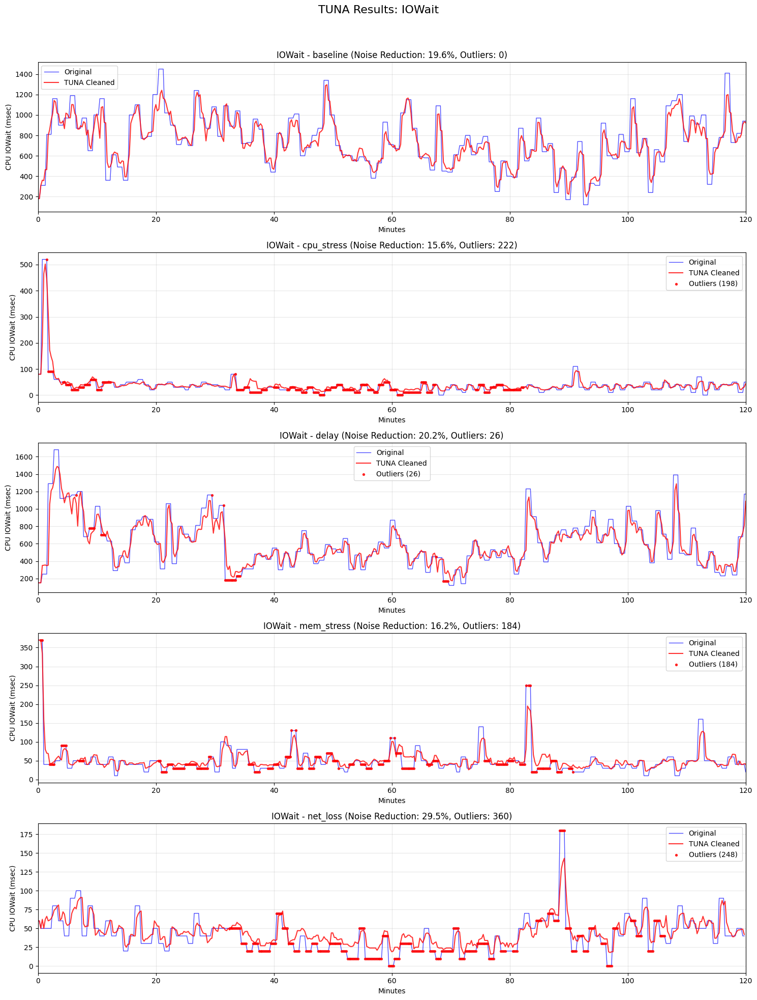

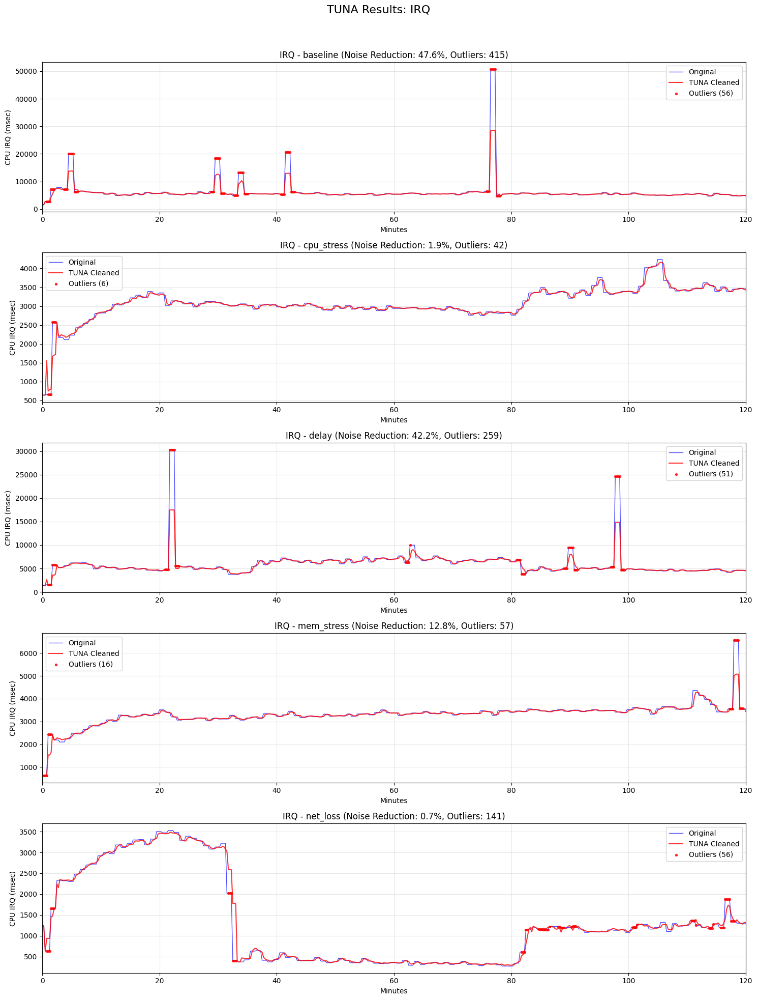

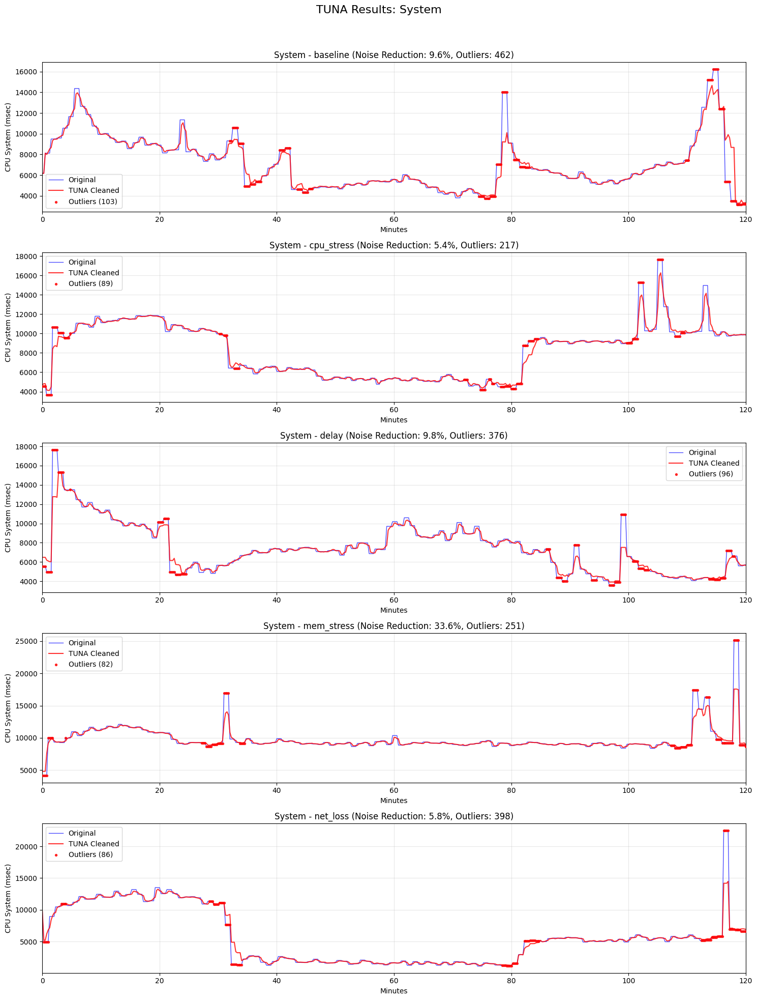

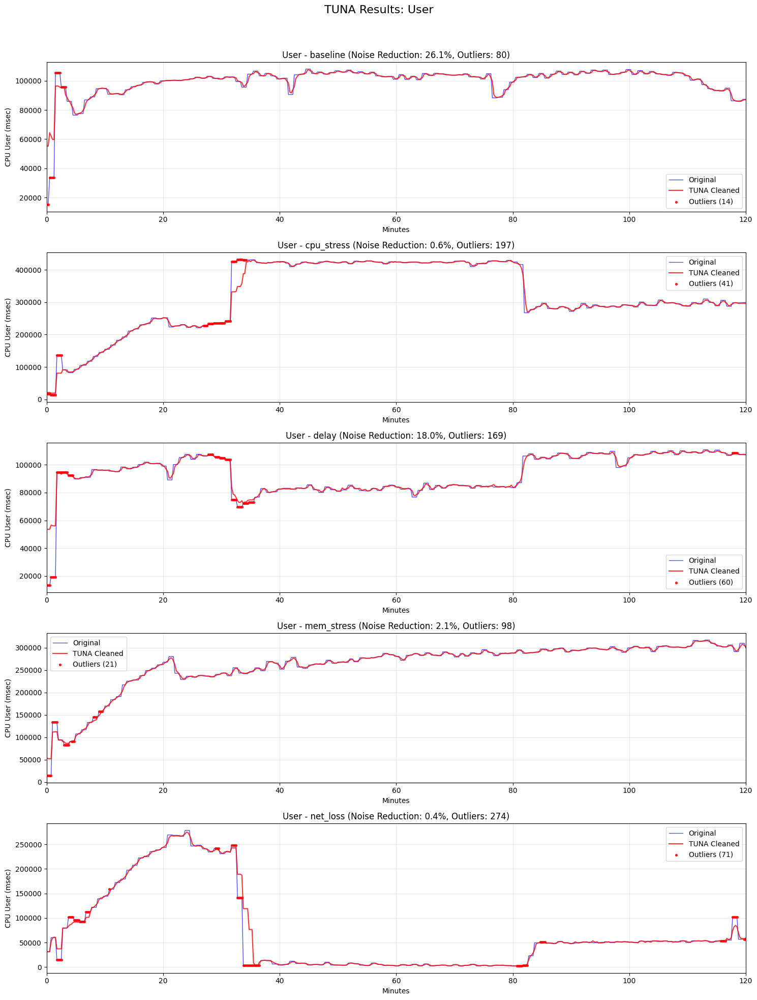

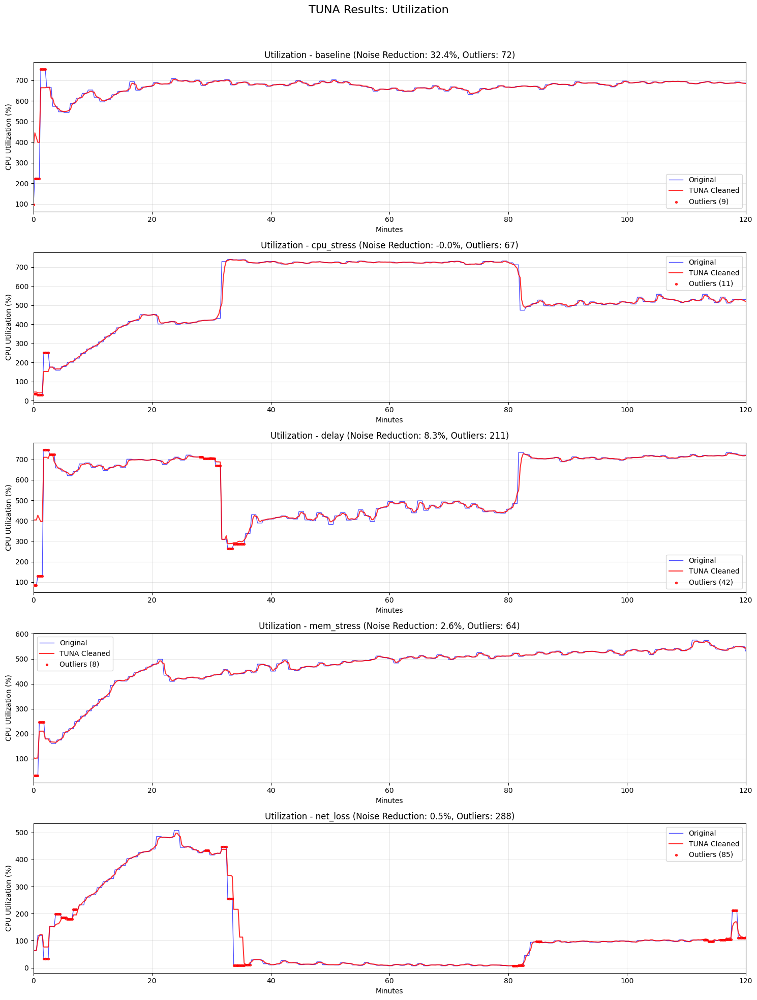


TUNA Results Summary:
Metric          Experiment      Outliers   Noise Red%   Correlation 
----------------------------------------------------------------------
IOWait          baseline        0                19.6%       0.885
IOWait          cpu_stress      222              15.6%       0.884
IOWait          delay           26               20.2%       0.906
IOWait          mem_stress      184              16.2%       0.880
IOWait          net_loss        360              29.5%       0.838
IRQ             baseline        415              47.6%       0.992
IRQ             cpu_stress      42                1.9%       0.976
IRQ             delay           259              42.2%       0.948
IRQ             mem_stress      57               12.8%       0.944
IRQ             net_loss        141               0.7%       0.992
System          baseline        462               9.6%       0.951
System          cpu_stress      217               5.4%       0.982
System          delay           3

In [41]:
def get_tuna_parameters(metric_name, experiment_type):
    """Get consistent TUNA parameters for a metric and experiment"""
    
    if "iowait" in metric_name.lower():
        if experiment_type == "baseline":
            window_size = 3
            threshold = 3.05      
        elif experiment_type == "cpu_stress":
            window_size = 30
            threshold = 12      
        elif experiment_type == "delay":
            window_size = 20
            threshold = 8      
        elif experiment_type == "mem_stress":
            window_size = 30
            threshold = 10      
        elif experiment_type == "net_loss":
            window_size = 80
            threshold = 11.5 
    elif "irq" in metric_name.lower():
        window_size = 4         #4 0.8
        threshold = 0.8
    elif "system" in metric_name.lower():
        window_size = 16
        threshold = 0.8
    elif "user" in metric_name.lower():
        window_size = 20
        threshold = 0.6
    elif "utilization" in metric_name.lower():
        window_size = 20
        threshold = 0.8

    
    min_absolute_range_factor = 0.8
    penalty_factor = 0.5
    lookback_window = 20
    
    return {
        'window_size': window_size,
        'threshold': threshold,
        'min_absolute_range_factor': min_absolute_range_factor,
        'penalty_factor': penalty_factor,
        'lookback_window': min(lookback_window, 15)
    }

def detect_outliers_tuna_memory(timeseries, metric_name="", experiment_type=""):
    """TUNA's relative range outlier detection with MIN/MAX marking"""
    
    outlier_mask = np.zeros(len(timeseries), dtype=bool)
    params = get_tuna_parameters(metric_name, experiment_type)
    
    window_size = params['window_size']
    threshold = params['threshold']
    min_absolute_range = params['min_absolute_range_factor'] * np.std(timeseries)
    
    # Analyze windows with sliding step (step=1)
    for i in range(0, len(timeseries) - window_size + 1, 1):
        window = timeseries[i:i + window_size]
        window_mean = np.mean(window)
        window_range = np.max(window) - np.min(window)
        
        if window_mean > 0:
            relative_range = window_range / window_mean
            
            # Apply outlier detection
            if relative_range > threshold and window_range > min_absolute_range:
                window_max = np.max(window)
                window_min = np.min(window)
                
                # Mark only min/max values as outliers
                for j in range(window_size):
                    actual_idx = i + j
                    if actual_idx < len(timeseries):
                        if (timeseries[actual_idx] == window_max or 
                            timeseries[actual_idx] == window_min):
                            outlier_mask[actual_idx] = True
    
    return outlier_mask

def get_local_stable_baseline(timeseries, stable_mask, current_idx, lookback_window):
    """Get local baseline from recent stable points - simplified strategy"""
    
    # Look backwards for recent stable points
    start_idx = max(0, current_idx - lookback_window)
    local_window = timeseries[start_idx:current_idx]
    local_stable_mask = stable_mask[start_idx:current_idx]
    
    recent_stable = local_window[local_stable_mask]
    
    if len(recent_stable) >= 3:
        return np.median(recent_stable)
    elif len(recent_stable) >= 1:
        return np.mean(recent_stable)
    
    # If no recent stable points, look forward
    end_idx = min(len(timeseries), current_idx + lookback_window)
    forward_window = timeseries[current_idx+1:end_idx]
    forward_stable_mask = stable_mask[current_idx+1:end_idx]
    
    forward_stable = forward_window[forward_stable_mask]
    
    if len(forward_stable) >= 1:
        return np.median(forward_stable) if len(forward_stable) >= 3 else np.mean(forward_stable)
    
    # Fallback to global median of stable values
    stable_values = timeseries[stable_mask]
    return np.mean(stable_values) if len(stable_values) > 0 else np.median(timeseries)

def apply_penalty_local_trend(timeseries, outlier_mask, metric_name="", experiment_type=""):
    """Apply penalty based on local stable trend"""
    
    cleaned_series = timeseries.copy()
    stable_mask = ~outlier_mask
    params = get_tuna_parameters(metric_name, experiment_type)
    
    effective_penalty = params['penalty_factor']
    lookback_window = params['lookback_window']
    
    for i in range(len(timeseries)):
        if outlier_mask[i]:
            local_baseline = get_local_stable_baseline(timeseries, stable_mask, i, lookback_window)
            original_value = timeseries[i]
            deviation = original_value - local_baseline
            cleaned_series[i] = local_baseline + deviation * effective_penalty
    
    return cleaned_series

def create_features_for_ml(timeseries, stable_mask, experiment_type):
    """Create features ONLY from stable regions"""
    
    features = []
    feature_indices = []
    window_size = 3  # Fixed feature window size
    
    for i in range(window_size, len(timeseries)):
        if stable_mask[i]:
            window = timeseries[i-window_size:i]
            window_stable_mask = stable_mask[i-window_size:i]
            
            # Only create features if at least 80% of the window is stable
            stable_ratio = np.sum(window_stable_mask) / len(window_stable_mask)
            if stable_ratio >= 0.8:
                stable_window = window[window_stable_mask]
                
                if len(stable_window) > 0:
                    feature_vector = [
                        np.mean(stable_window),
                        np.std(stable_window),
                        np.median(stable_window),
                        np.max(stable_window) - np.min(stable_window),
                        timeseries[i-1] if stable_mask[i-1] else np.mean(stable_window),
                        i / len(timeseries),
                    ]
                    
                    feature_vector = [0.0 if np.isnan(val) or np.isinf(val) else float(val) for val in feature_vector]
                    
                    exp_features = [0, 0, 0, 0, 0]
                    if experiment_type == "baseline":
                        exp_features[0] = 1
                    elif experiment_type == "cpu_stress":
                        exp_features[1] = 1
                    elif experiment_type == "delay":
                        exp_features[2] = 1
                    elif experiment_type == "mem_stress":
                        exp_features[3] = 1
                    elif experiment_type == "net_loss":
                        exp_features[4] = 1
                    
                    feature_vector.extend(exp_features)
                    features.append(feature_vector)
                    feature_indices.append(i)
    
    return np.array(features), np.array(feature_indices)

def apply_tuna_to_single_series(col, exp_name, model, scaler, metric_name=""):
    """Apply TUNA cleaning to a single series"""
    
    # Phase 1: Identify outliers
    outlier_mask = detect_outliers_tuna_memory(col, metric_name=metric_name, experiment_type=exp_name)
    stable_mask = ~outlier_mask
    outliers_count = np.sum(outlier_mask)
    
    # Phase 2: Apply penalty
    cleaned_series = col.copy()
    if outliers_count > 0:
        cleaned_series = apply_penalty_local_trend(col, outlier_mask, metric_name, exp_name)
    
    # Phase 3: ML enhancement
    if model is not None and scaler is not None:
        features, feature_indices = create_features_for_ml(col, stable_mask, exp_name)
        
        if len(features) > 0:
            features_scaled = scaler.transform(features)
            ml_predictions = model.predict(features_scaled)
            
            for i, prediction in enumerate(ml_predictions):
                actual_idx = feature_indices[i]
                if actual_idx < len(cleaned_series) and stable_mask[actual_idx]:
                    if not np.isnan(prediction) and not np.isinf(prediction):
                        cleaned_series[actual_idx] = prediction
    
    # Calculate statistics
    original_std = np.std(col)
    cleaned_std = np.std(cleaned_series)
    noise_reduction = (original_std - cleaned_std) / original_std * 100
    correlation = np.corrcoef(col, cleaned_series)[0, 1]
    
    return cleaned_series, outlier_mask, {
        'outliers': outliers_count,
        'noise_reduction': noise_reduction,
        'correlation': correlation
    }

def apply_tuna_to_dataframe(df, exp_name, models, scalers, metric_name=""):
    """Apply TUNA cleaning to each column in DataFrame"""
    
    exclude_cols = ['Time', 'Minutes', 'source']
    value_cols = [col for col in df.columns if col not in exclude_cols]
    
    column_results = {}
    cleaned_df = df.copy()
    
    for col in value_cols:
        col_values = df[col].values
        model = models.get(col)
        scaler = scalers.get(col)
        
        cleaned_values, outlier_mask, stats = apply_tuna_to_single_series(
            col_values, exp_name, model, scaler, metric_name
        )
        
        column_results[col] = {
            'original': col_values,
            'cleaned': cleaned_values,
            'outliers': outlier_mask,
            'stats': stats
        }
        
        cleaned_df[col] = cleaned_values
    
    return cleaned_df, column_results

def train_models_for_all_columns(metric_name, all_experiments):
    """Train RandomForest models for each column using stable periods"""
    
    exclude_cols = ['Time', 'Minutes', 'source']
    first_df = list(all_experiments.values())[0]
    value_cols = [col for col in first_df.columns if col not in exclude_cols]
    
    models = {}
    scalers = {}
    
    for col in value_cols:  # For every feature 
        X_stable_all = []
        y_stable_all = []
        
        for exp_name, df in all_experiments.items():  # For every experiment
            col_values = df[col].values  # Take the values of the specific feature of the specific experiment
            
            # Detect outliers for this experiment
            outlier_mask = detect_outliers_tuna_memory(col_values, metric_name=metric_name, experiment_type=exp_name)
            stable_mask = ~outlier_mask
            
            # Extract features from stable periods only
            features, feature_indices = create_features_for_ml(col_values, stable_mask, exp_name)
            
            if len(features) > 0:
                # Take original values for stable indices where i created features
                stable_targets = col_values[feature_indices]
                
                # Smooth targets with local median for denoising training. I assume that are nearby values
                smoothed_targets = []
                for j, target in enumerate(stable_targets):
                    start_idx = max(0, j-2)
                    end_idx = min(len(stable_targets), j+3)
                    local_values = stable_targets[start_idx:end_idx]
                    smoothed_targets.append(np.median(local_values))
                
                # Accumulate training data across experiments
                X_stable_all.extend(features)
                y_stable_all.extend(smoothed_targets)
        
        # Train model if sufficient data available
        if len(X_stable_all) >= 10:
            X_stable_all = np.array(X_stable_all)
            y_stable_all = np.array(y_stable_all)
            
            # Feature scaling
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X_stable_all)
            
            # Hyperparameter grid for optimization
            param_grid = {
                'n_estimators': [100],
                'max_depth': [5, 10, 15],
                'min_samples_split': [2, 5],
                'min_samples_leaf': [1, 2, 4],
                'max_features': ['sqrt', 'log2']
            }
            
            # Create and configure RandomForest model
            model = RandomForestRegressor(
                criterion='squared_error',
                bootstrap=True,
                n_jobs=-1,
                random_state=42
            )
            
            # Grid search for best hyperparameters
            grid_search = GridSearchCV(
                estimator=model,
                param_grid=param_grid,
                scoring='neg_mean_squared_error',
                cv=3,
                n_jobs=-1,
                verbose=0
            )
            
            # Train the model
            grid_search.fit(X_scaled, y_stable_all)
            
            # Store best model and scaler
            models[col] = grid_search.best_estimator_
            scalers[col] = scaler
        else:
            models[col] = None
            scalers[col] = None
    
    return models, scalers

def run_tuna_analysis(all_datasets):
    """Run TUNA analysis on all datasets"""
    
    tuna_results = {}
    
    for metric_name, experiments in all_datasets.items():
        
        valid_experiments = {}
        for exp_name, df in experiments.items():
            exclude_cols = ['Time', 'Minutes', 'source']
            value_cols = [col for col in df.columns if col not in exclude_cols]
            cumulative_values = df[value_cols].sum(axis=1).values
            
            has_variance = (np.std(cumulative_values) > 0 and len(np.unique(cumulative_values)) > 1)
            if has_variance:
                valid_experiments[exp_name] = df
        
        if not valid_experiments:
            continue
        
        # Train models
        models, scalers = train_models_for_all_columns(metric_name, valid_experiments)
        
        metric_results = {}
        for exp_name, df in experiments.items():
            if exp_name in valid_experiments:
                # Apply TUNA cleaning
                cleaned_df, column_results = apply_tuna_to_dataframe(
                    df, exp_name, models, scalers, metric_name=metric_name
                )
                
                total_outliers = sum(result['stats']['outliers'] for result in column_results.values())
                
                exclude_cols = ['Time', 'Minutes', 'source']
                value_cols = [col for col in df.columns if col not in exclude_cols]
                
                original_cumulative = df[value_cols].sum(axis=1).values
                cleaned_cumulative = cleaned_df[value_cols].sum(axis=1).values
                
                original_std = np.std(original_cumulative)
                cleaned_std = np.std(cleaned_cumulative)
                noise_reduction = (original_std - cleaned_std) / original_std * 100 if original_std > 0 else 0
                correlation = np.corrcoef(original_cumulative, cleaned_cumulative)[0, 1]
                
                overall_outlier_mask = np.zeros(len(df), dtype=bool)
                for col_result in column_results.values():
                    overall_outlier_mask |= col_result['outliers']
                
                metric_results[exp_name] = {
                    'original': original_cumulative,
                    'cleaned': cleaned_cumulative,
                    'outliers': overall_outlier_mask,
                    'stats': {
                        'outliers': total_outliers,
                        'noise_reduction': noise_reduction,
                        'correlation': correlation
                    },
                    'column_results': column_results,
                    'cleaned_df': cleaned_df
                }
            else:
                # No cleaning for invalid experiments
                exclude_cols = ['Time', 'Minutes', 'source']
                value_cols = [col for col in df.columns if col not in exclude_cols]
                cumulative_values = df[value_cols].sum(axis=1).values
                
                metric_results[exp_name] = {
                    'original': cumulative_values,
                    'cleaned': cumulative_values,
                    'outliers': np.zeros(len(df), dtype=bool),
                    'stats': {
                        'outliers': 0,
                        'noise_reduction': 0.0,
                        'correlation': 1.0
                    },
                    'column_results': {},
                    'cleaned_df': df.copy()
                }
        
        if metric_results:
            tuna_results[metric_name] = metric_results
    
    return tuna_results

def plot_tuna_results(tuna_results, all_datasets):
    """Plot TUNA results"""
    
    for metric_name, metric_results in tuna_results.items():
        n_experiments = len(metric_results)
        fig, axes = plt.subplots(n_experiments, 1, figsize=(15, 4*n_experiments))
        
        if n_experiments == 1:
            axes = [axes]
        
        for i, (exp_name, results) in enumerate(metric_results.items()):
            original = results['original']
            cleaned = results['cleaned']
            outliers = results['outliers']
            stats = results['stats']
            
            df = all_datasets[metric_name][exp_name]
            minutes = df['Minutes'].values
            
            # Plot data
            axes[i].plot(minutes, original, 'b-', alpha=0.7, label='Original', linewidth=1)
            axes[i].plot(minutes, cleaned, 'r-', alpha=0.8, label='TUNA Cleaned', linewidth=1.5)
            
            # Mark outliers
            if np.any(outliers):
                outlier_minutes = minutes[outliers]
                outlier_original_values = original[outliers]
                axes[i].scatter(outlier_minutes, outlier_original_values, 
                              color='red', s=8, alpha=0.8, marker='o', 
                              label=f'Outliers ({np.sum(outliers)})', zorder=5)
            
            # Labels based on CPU metrics
            if 'iowait' in metric_name.lower():
                y_label = 'CPU IOWait (msec)'
            elif 'irq' in metric_name.lower():
                y_label = 'CPU IRQ (msec)'
            elif 'system' in metric_name.lower():
                y_label = 'CPU System (msec)'
            elif 'user' in metric_name.lower():
                y_label = 'CPU User (msec)'
            elif 'util' in metric_name.lower():
                y_label = 'CPU Utilization (%)'
            else:
                y_label = 'CPU Values'
            
            axes[i].set_title(f'{metric_name} - {exp_name} (Noise Reduction: {stats["noise_reduction"]:.1f}%, Outliers: {stats["outliers"]})')
            axes[i].set_xlabel('Minutes')
            axes[i].set_ylabel(y_label)
            axes[i].set_xlim(0, 120)
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)
        
        plt.suptitle(f'TUNA Results: {metric_name}', fontsize=16, y=0.98)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

def print_tuna_summary(tuna_results):
    """Print TUNA summary"""
    
    print(f"\nTUNA Results Summary:")
    print("="*70)
    print(f"{'Metric':<15} {'Experiment':<15} {'Outliers':<10} {'Noise Red%':<12} {'Correlation':<12}")
    print("-"*70)
    
    for metric_name, metric_results in tuna_results.items():
        for exp_name, results in metric_results.items():
            stats = results['stats']
            print(f"{metric_name:<15} {exp_name:<15} {stats['outliers']:<10} "
                  f"{stats['noise_reduction']:>10.1f}% {stats['correlation']:>11.3f}")

def export_tuna_data_to_csv(tuna_results, export_dir="../../noise_reduction_data"):
    """Export TUNA results to CSV"""
    
    os.makedirs(export_dir, exist_ok=True)
    export_data = []
    
    for metric_name, metric_data in tuna_results.items():
        for experiment_name, experiment_data in metric_data.items():
            if 'stats' in experiment_data:
                stats = experiment_data['stats']
                export_data.append({
                    'experiment_name': experiment_name,
                    'metric': metric_name,
                    'noise_reduction_pct': stats.get('noise_reduction', 0.0),
                    'correlation': stats.get('correlation', 1.0),
                    'outliers_removed': stats.get('outliers', 0),
                })
    
    csv_filename = "gateway_tuna_cpu.csv"
    csv_path = os.path.join(export_dir, csv_filename)
    
    df_simple = pd.DataFrame(export_data)
    df_simple.to_csv(csv_path, index=False)
    return csv_path

def create_cleaned_csv_from_tuna_columns(original_df, column_results, metric_name, experiment_name, include_metadata=False):
    """Create a new DataFrame with TUNA-cleaned values"""
    
    cleaned_df = original_df.copy()
    
    exclude_cols = ['Time', 'Minutes', 'source']
    value_cols = [col for col in cleaned_df.columns if col not in exclude_cols]
    
    total_outliers = 0
    
    for col in value_cols:
        if col in column_results:
            cleaned_values = column_results[col]['cleaned']
            cleaned_df[col] = cleaned_values[:len(cleaned_df)]
            total_outliers += column_results[col]['stats']['outliers']
    
    if include_metadata:
        cleaned_df['tuna_processed'] = True
        cleaned_df['tuna_total_outliers'] = total_outliers
        cleaned_df['tuna_metric_name'] = metric_name
        cleaned_df['tuna_experiment'] = experiment_name
        
        for col in value_cols:
            if col in column_results:
                outlier_mask = column_results[col]['outliers']
                cleaned_df[f'tuna_outlier_{col}'] = outlier_mask[:len(cleaned_df)]
                cleaned_df[f'tuna_noise_reduction_{col}'] = column_results[col]['stats']['noise_reduction']
                cleaned_df[f'tuna_correlation_{col}'] = column_results[col]['stats']['correlation']
    
    return cleaned_df

def export_all_cleaned_csvs(tuna_results, all_datasets, output_base_path="cleaned_data", include_metadata=False):
    """Export all TUNA-cleaned datasets organized by experiment type"""
    
    output_base = Path(output_base_path)
    output_base.mkdir(parents=True, exist_ok=True)
    
    created_files = {}
    total_files = 0
    
    experiment_types = set()
    for metric_results in tuna_results.values():
        experiment_types.update(metric_results.keys())
    
    for exp_name in experiment_types:
        exp_dir = output_base / exp_name
        exp_dir.mkdir(exist_ok=True)
        created_files[exp_name] = []
    
    for metric_name, metric_results in tuna_results.items():
        for exp_name, results in metric_results.items():
            original_df = all_datasets[metric_name][exp_name]
            
            if 'column_results' in results:
                column_results = results['column_results']
            else:
                column_results = {}
            
            cleaned_df = create_cleaned_csv_from_tuna_columns(
                original_df=original_df,
                column_results=column_results,
                metric_name=metric_name,
                experiment_name=exp_name,
                include_metadata=include_metadata
            )
            
            csv_filename = f"cpu_{metric_name.lower()}.csv"
            csv_path = output_base / exp_name / csv_filename
            
            cleaned_df.to_csv(csv_path, index=False)
            created_files[exp_name].append(str(csv_path))
            total_files += 1
    
    return created_files

tuna_results = run_tuna_analysis(all_datasets)
plot_tuna_results(tuna_results, all_datasets)
print_tuna_summary(tuna_results)
csv_path = export_tuna_data_to_csv(tuna_results)
cleaned_files = export_all_cleaned_csvs(tuna_results, all_datasets)



COMPREHENSIVE CPU METRIC ANALYSIS
Each CPU metric will be compared to its own baseline

🔍 Analyzing IOWait...

📊 Comparing IOWait: cpu_stress stress vs baseline


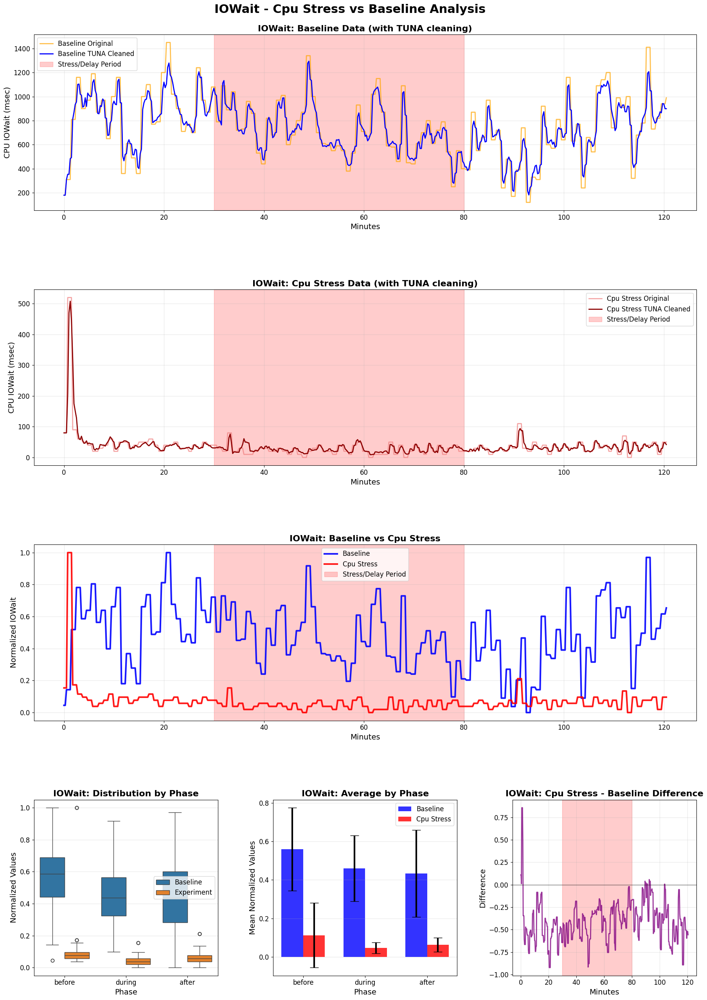


IOWAIT - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 222 outliers removed
    Noise Reduction: 13.9%, Correlation: 0.887
  BASELINE: 0 outliers removed
    Noise Reduction: 19.2%, Correlation: 0.891

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4336  0.2257  0.0000  0.9699
before  0.5596  0.2150  0.0451  1.0000
during  0.4589  0.1706  0.0977  0.9173

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0637  0.0364  0.0000  0.2115
before  0.1128  0.1682  0.0385  1.0000
during  0.0465  0.0290  0.0000  0.1538

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 17.93, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 33.78, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= 20.59, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  :  -79.84% (DECREASE)
  DURING  :  -89.87% (DECREASE)
  AFTER   :  -85.30% (DECREASE)

📊 Comparing IOWait: delay str

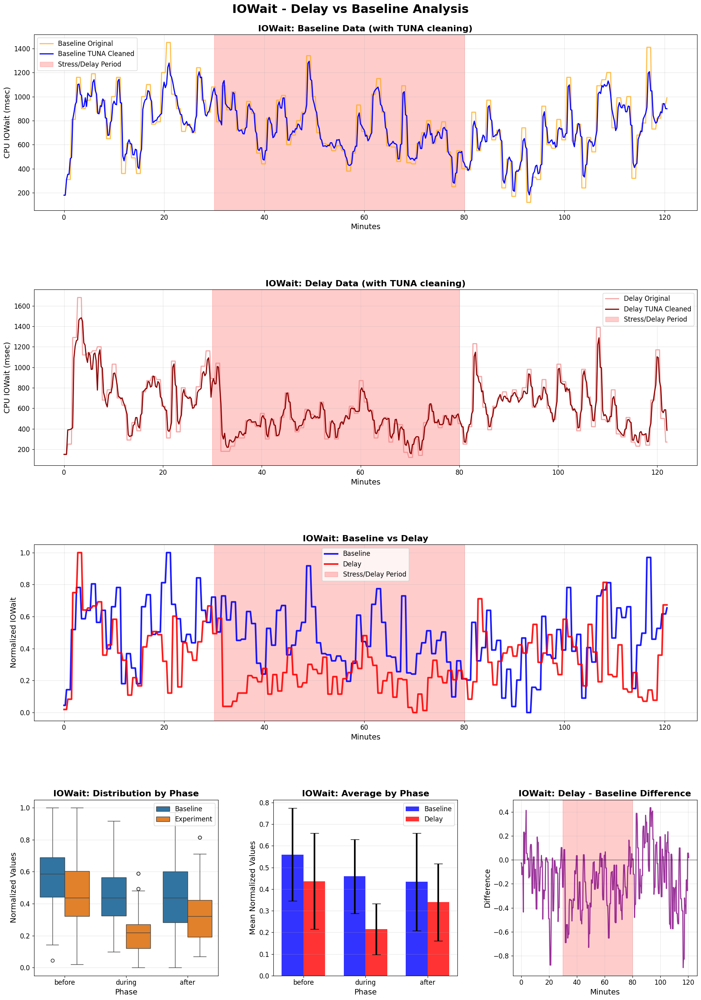


IOWAIT - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 26 outliers removed
    Noise Reduction: 19.6%, Correlation: 0.910
  BASELINE: 0 outliers removed
    Noise Reduction: 19.2%, Correlation: 0.891

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4336  0.2257  0.0000  0.9699
before  0.5596  0.2150  0.0451  1.0000
during  0.4589  0.1706  0.0977  0.9173

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.3393  0.1778  0.0705  0.8141
before  0.4364  0.2218  0.0192  1.0000
during  0.2154  0.1178  0.0000  0.5897

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  4.37, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 16.65, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  4.18, p=  0.0000 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :  -22.02% (DECREASE)
  DURING  :  -53.07% (DECREASE)
  AFTER   :  -21.76% (DECREASE)

📊 Comparing IOWait: mem_stress stress vs baseline


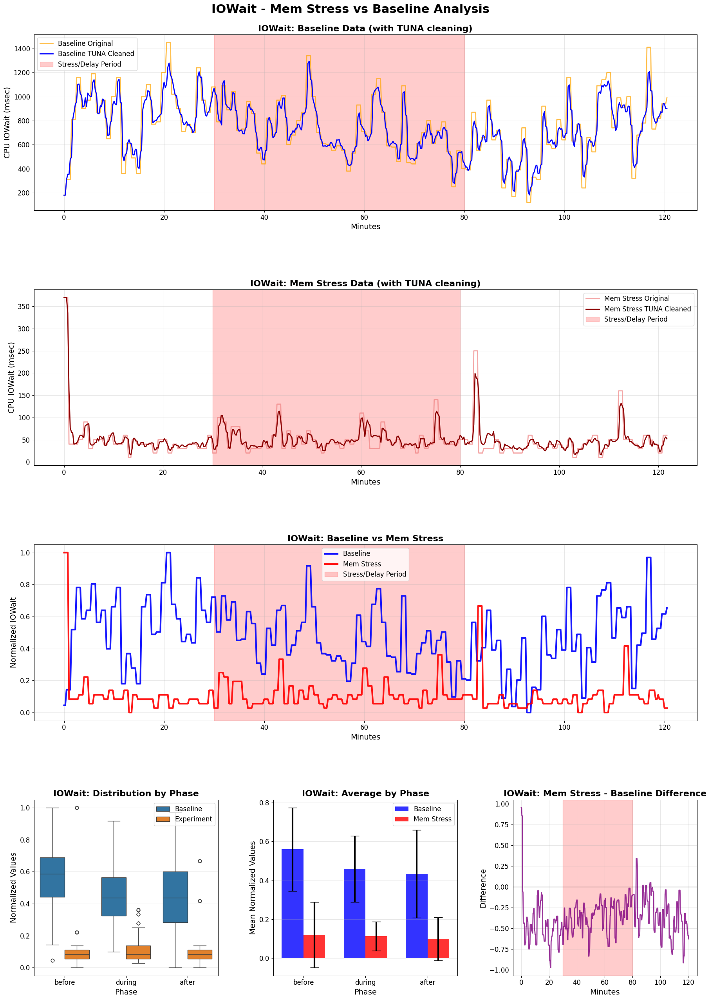


IOWAIT - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 184 outliers removed
    Noise Reduction: 14.6%, Correlation: 0.885
  BASELINE: 0 outliers removed
    Noise Reduction: 19.2%, Correlation: 0.891

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4336  0.2257  0.0000  0.9699
before  0.5596  0.2150  0.0451  1.0000
during  0.4589  0.1706  0.0977  0.9173

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0979  0.1112  0.0000  0.6667
before  0.1192  0.1690  0.0000  1.0000
during  0.1128  0.0750  0.0278  0.3611

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 17.64, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 26.33, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= 16.98, p=  0.0000 (SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  :  -78.70% (DECREASE)
  DURING  :  -75.43% (DECREASE)
  AFTER   :  -77.42% (DECREASE)

📊 Comparing IOWait: net_loss 

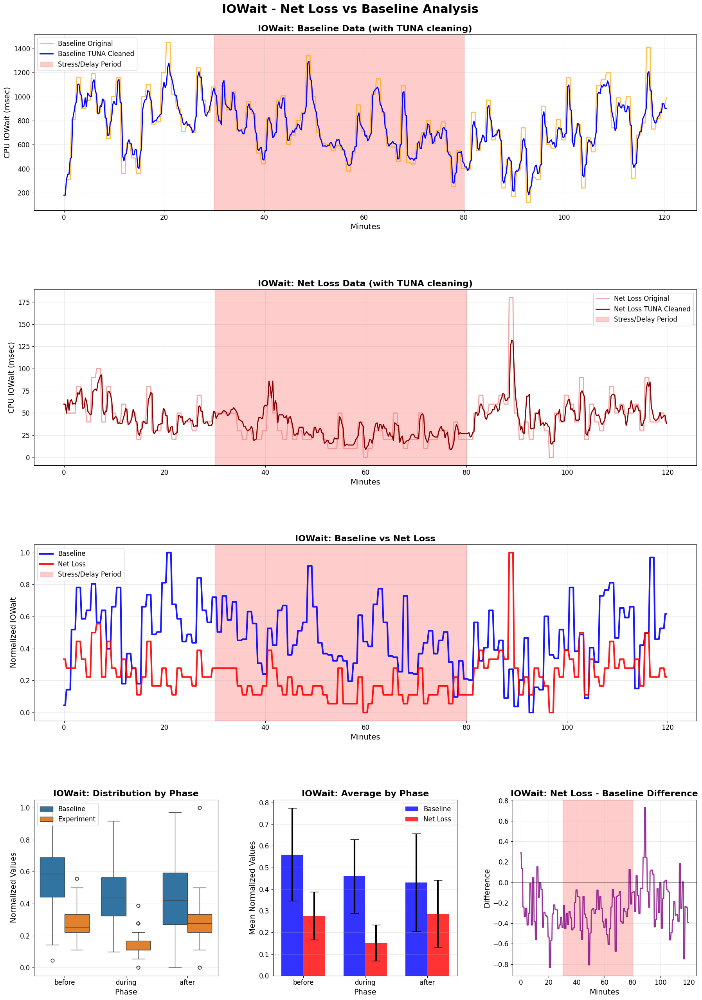


IOWAIT - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 289 outliers removed
    Noise Reduction: 25.1%, Correlation: 0.810
  BASELINE: 0 outliers removed
    Noise Reduction: 19.2%, Correlation: 0.891

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4299  0.2262  0.0000  0.9699
before  0.5596  0.2150  0.0451  1.0000
during  0.4589  0.1706  0.0977  0.9173

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2858  0.1559  0.0000  1.0000
before  0.2769  0.1104  0.1111  0.5556
during  0.1515  0.0828  0.0000  0.3889

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 12.82, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 22.98, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  6.62, p=  0.0000 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  :  -50.53% (DECREASE)
  DURING  :  -66.99% (DECREASE)
  AFTER   :  -33.52% (DECREASE)

🔍 Analyzing IRQ...

📊 Comparing IRQ: 

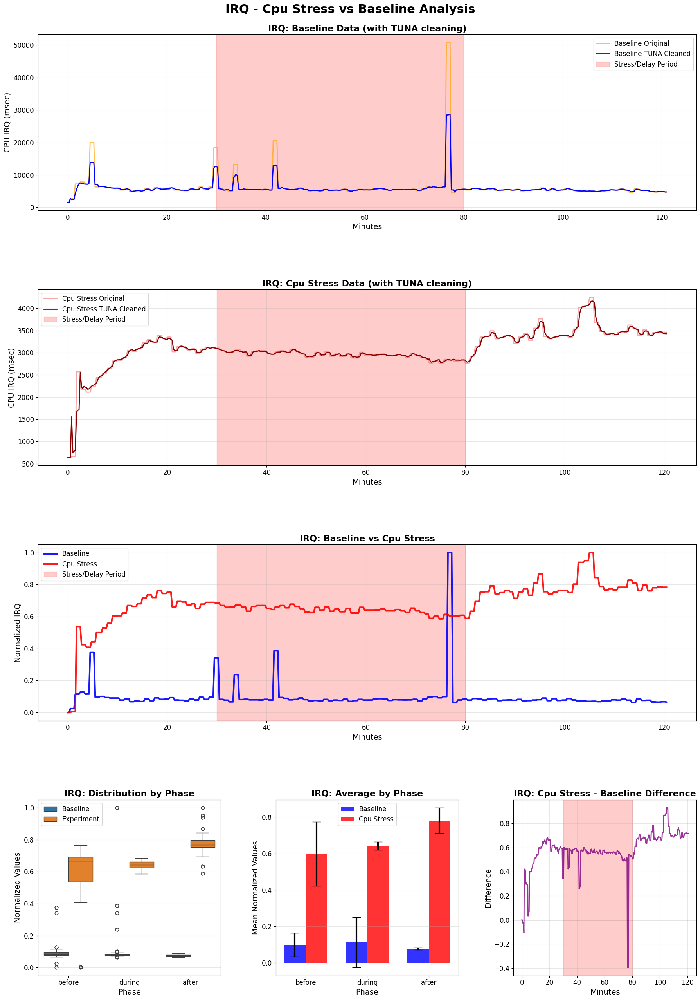


IRQ - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 42 outliers removed
    Noise Reduction: 1.9%, Correlation: 0.976
  BASELINE: 415 outliers removed
    Noise Reduction: 47.6%, Correlation: 0.992

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0770  0.0067  0.0638  0.0902
before  0.0984  0.0648  0.0000  0.3754
during  0.1110  0.1381  0.0634  1.0000

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.7807  0.0703  0.5889  1.0000
before  0.5971  0.1768  0.0000  0.7639
during  0.6410  0.0230  0.5861  0.6833

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=-29.02, p=  0.0000 (SIGNIFICANT)
  DURING  : t=-53.66, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=-126.91, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  : +506.96% (INCREASE)
  DURING  : +477.58% (INCREASE)
  AFTER   : +913.45% (INCREASE)

📊 Comparing IRQ: delay stress v

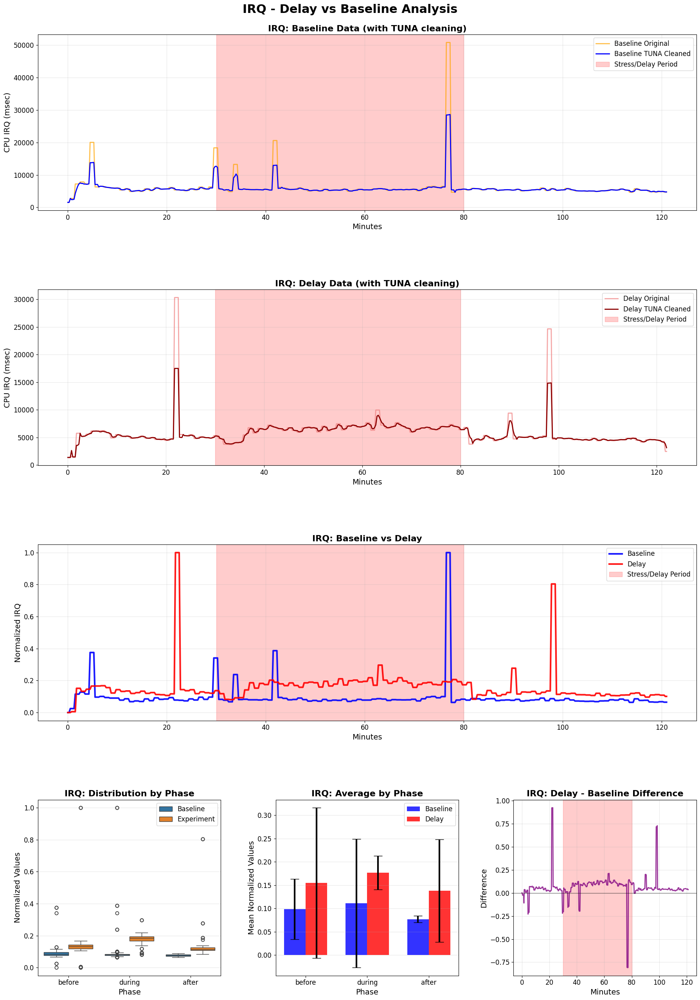


IRQ - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 259 outliers removed
    Noise Reduction: 42.2%, Correlation: 0.948
  BASELINE: 415 outliers removed
    Noise Reduction: 47.6%, Correlation: 0.992

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0769  0.0068  0.0638  0.0902
before  0.0984  0.0648  0.0000  0.3754
during  0.1110  0.1381  0.0634  1.0000

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.1379  0.1097  0.0833  0.8040
before  0.1547  0.1614  0.0000  1.0000
during  0.1767  0.0363  0.0809  0.2966

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= -3.55, p=  0.0005 (SIGNIFICANT)
  DURING  : t= -6.52, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -7.11, p=  0.0000 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :  +57.26% (INCREASE)
  DURING  :  +59.22% (INCREASE)
  AFTER   :  +79.38% (INCREASE)

📊 Comparing IRQ: mem_stress stress vs baseline


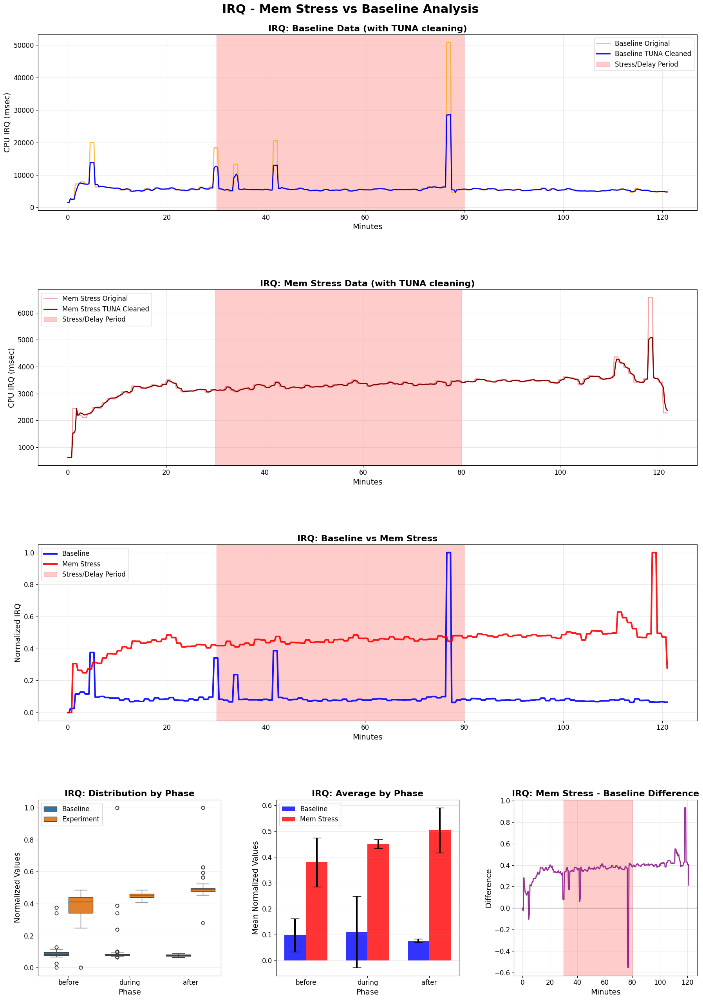


IRQ - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 57 outliers removed
    Noise Reduction: 12.8%, Correlation: 0.944
  BASELINE: 415 outliers removed
    Noise Reduction: 47.6%, Correlation: 0.992

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0769  0.0068  0.0638  0.0902
before  0.0984  0.0648  0.0000  0.3754
during  0.1110  0.1381  0.0634  1.0000

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.5043  0.0867  0.2790  1.0000
before  0.3803  0.0948  0.0000  0.4857
during  0.4511  0.0177  0.4101  0.4857

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=-26.89, p=  0.0000 (SIGNIFICANT)
  DURING  : t=-34.62, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=-62.94, p=  0.0000 (SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  : +286.64% (INCREASE)
  DURING  : +306.42% (INCREASE)
  AFTER   : +555.93% (INCREASE)

📊 Comparing IRQ: net_loss stres

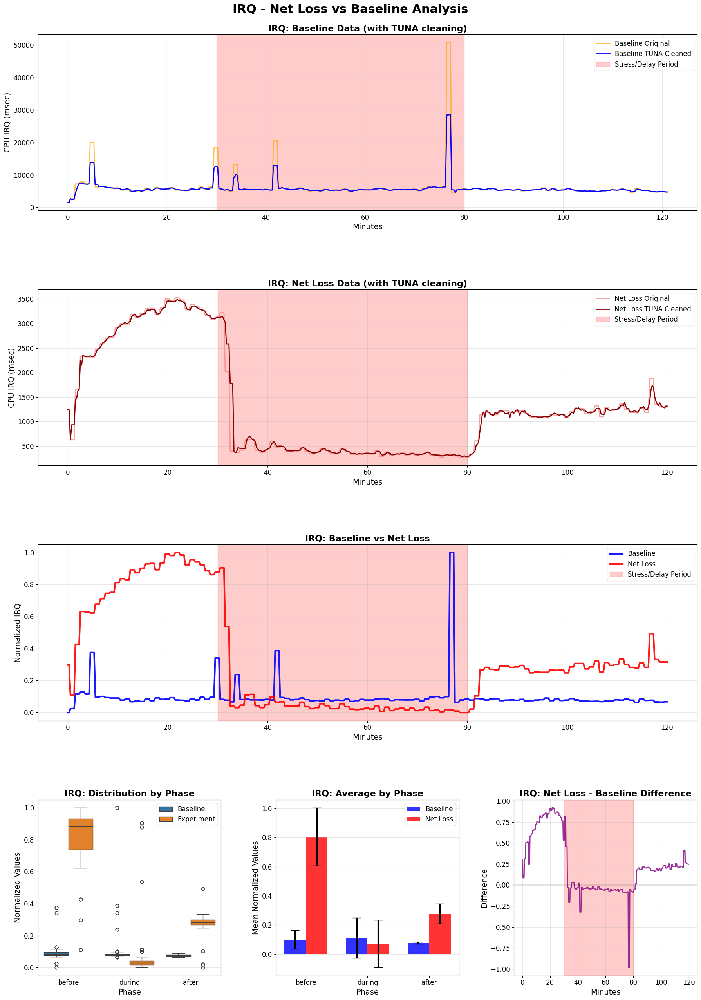


IRQ - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 141 outliers removed
    Noise Reduction: 0.7%, Correlation: 0.992
  BASELINE: 415 outliers removed
    Noise Reduction: 47.6%, Correlation: 0.992

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0772  0.0066  0.0638  0.0902
before  0.0984  0.0648  0.0000  0.3754
during  0.1110  0.1381  0.0634  1.0000

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2772  0.0679  0.0000  0.4939
before  0.8061  0.1990  0.1104  1.0000
during  0.0701  0.1631  0.0000  0.9049

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=-37.04, p=  0.0000 (SIGNIFICANT)
  DURING  : t=  2.71, p=  0.0070 (SIGNIFICANT)
  AFTER   : t=-37.08, p=  0.0000 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  : +719.45% (INCREASE)
  DURING  :  -36.80% (DECREASE)
  AFTER   : +259.26% (INCREASE)

🔍 Analyzing System...

📊 Comparing Syst

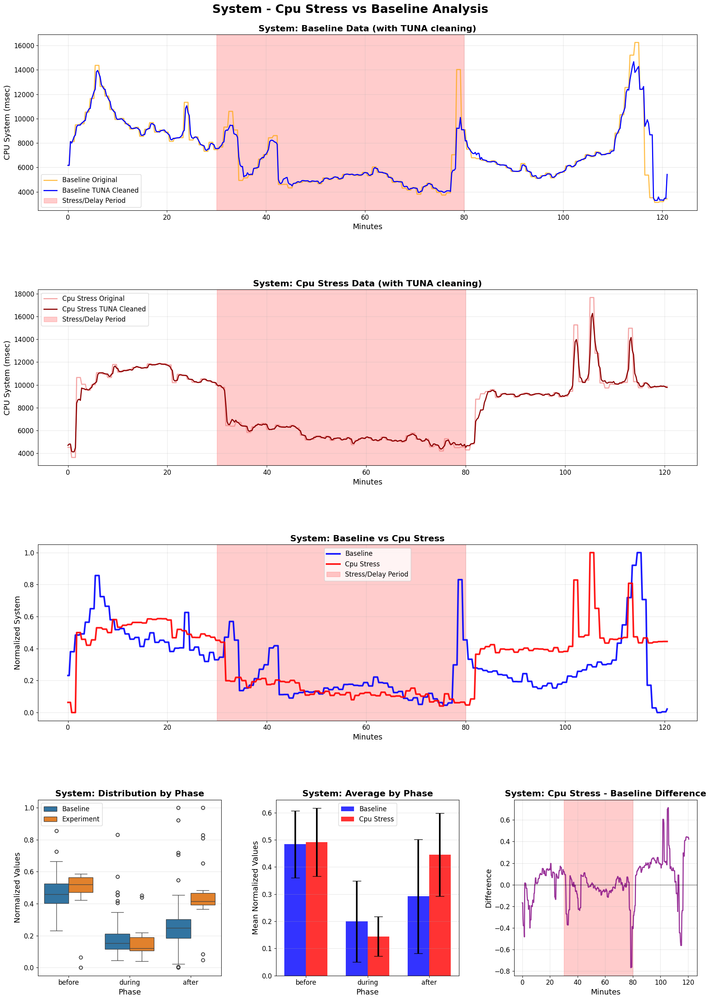


SYSTEM - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 217 outliers removed
    Noise Reduction: 5.4%, Correlation: 0.982
  BASELINE: 462 outliers removed
    Noise Reduction: 9.6%, Correlation: 0.951

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2917  0.2104  0.0000  1.0000
before  0.4837  0.1235  0.2317  0.8567
during  0.1997  0.1492  0.0457  0.8308

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4454  0.1528  0.0471  1.0000
before  0.4916  0.1253  0.0000  0.5870
during  0.1445  0.0733  0.0407  0.4515

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= -0.49, p=  0.6229 (NOT SIGNIFICANT)
  DURING  : t=  4.71, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -7.52, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  :   +1.63% (INCREASE)
  DURING  :  -27.63% (DECREASE)
  AFTER   :  +52.69% (INCREASE)

📊 Comparing System: delay

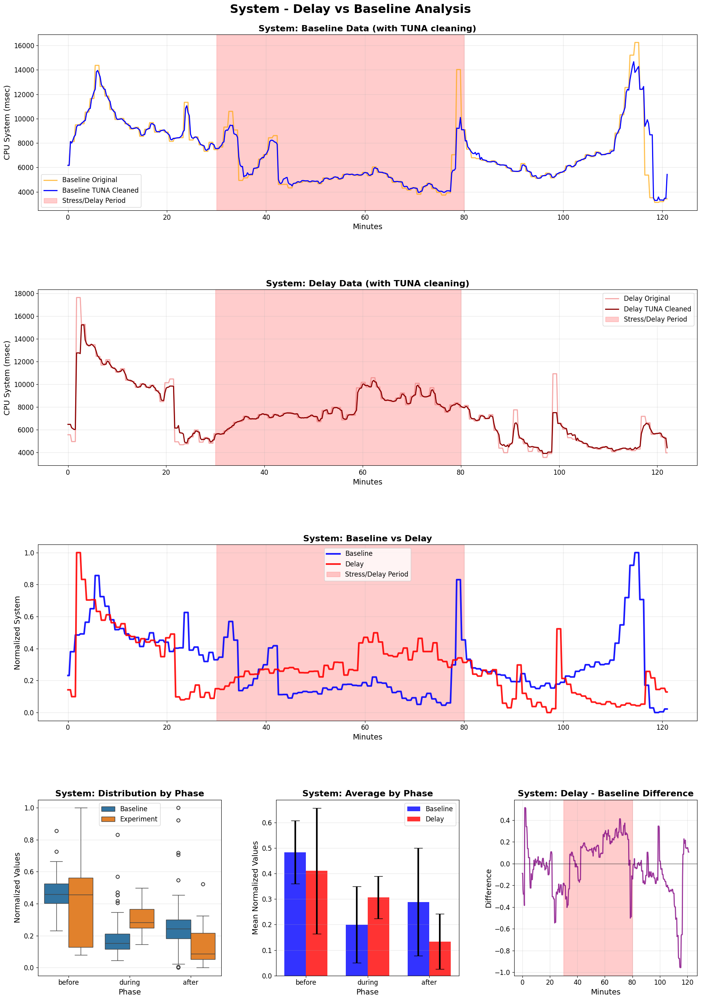


SYSTEM - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 376 outliers removed
    Noise Reduction: 9.8%, Correlation: 0.970
  BASELINE: 462 outliers removed
    Noise Reduction: 9.6%, Correlation: 0.951

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2884  0.2112  0.0000  1.0000
before  0.4837  0.1235  0.2317  0.8567
during  0.1997  0.1492  0.0457  0.8308

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.1338  0.1088  0.0000  0.5234
before  0.4101  0.2463  0.0795  1.0000
during  0.3065  0.0830  0.1449  0.4986

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  2.92, p=  0.0038 (SIGNIFICANT)
  DURING  : t= -8.86, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  8.33, p=  0.0000 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :  -15.20% (DECREASE)
  DURING  :  +53.45% (INCREASE)
  AFTER   :  -53.61% (DECREASE)

📊 Comparing System: mem_stress stress vs baseline

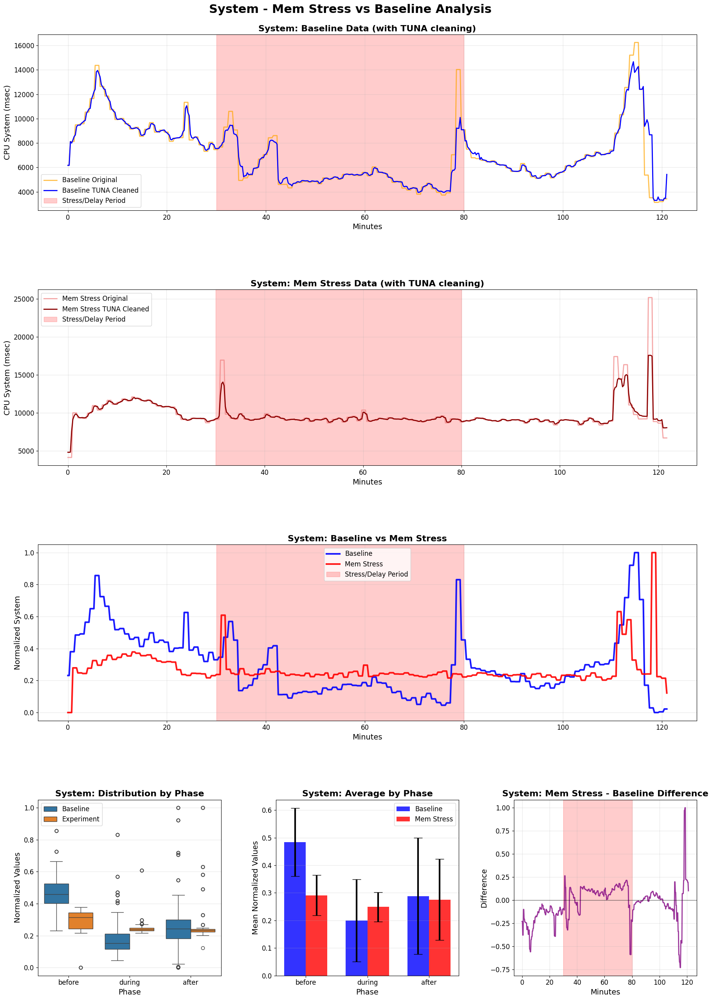


SYSTEM - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 251 outliers removed
    Noise Reduction: 33.6%, Correlation: 0.948
  BASELINE: 462 outliers removed
    Noise Reduction: 9.6%, Correlation: 0.951

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2884  0.2112  0.0000  1.0000
before  0.4837  0.1235  0.2317  0.8567
during  0.1997  0.1492  0.0457  0.8308

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2752  0.1469  0.1220  1.0000
before  0.2913  0.0734  0.0000  0.3789
during  0.2489  0.0535  0.2156  0.6087

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 14.67, p=  0.0000 (SIGNIFICANT)
  DURING  : t= -4.40, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  0.66, p=  0.5118 (NOT SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  :  -39.78% (DECREASE)
  DURING  :  +24.64% (INCREASE)
  AFTER   :   -4.58% (DECREASE)

📊 Comparing System: net_

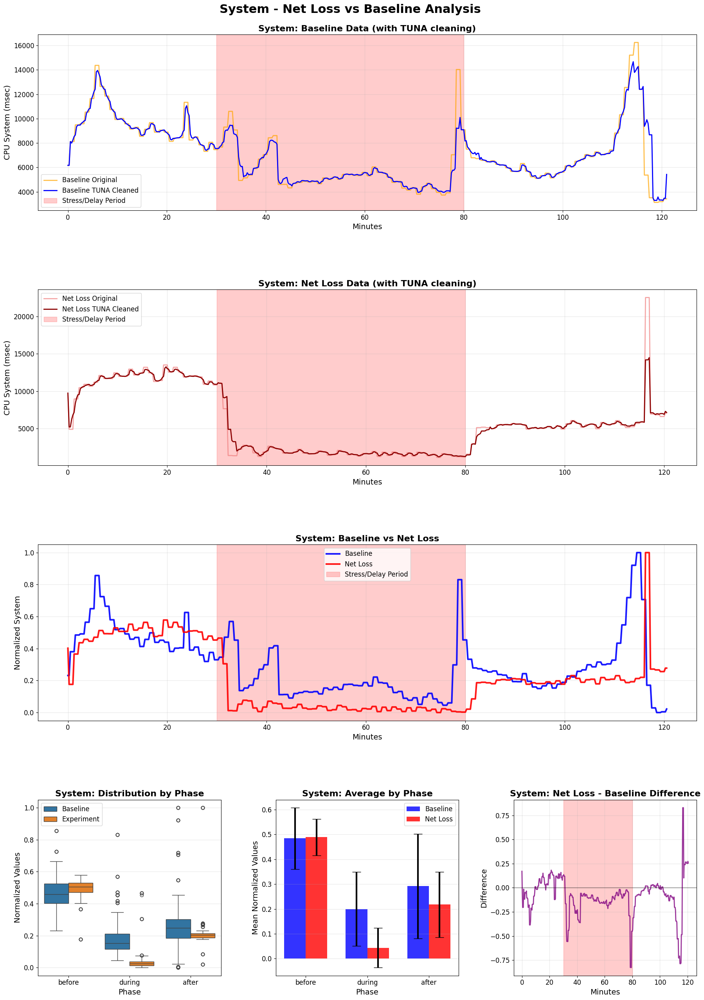


SYSTEM - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 398 outliers removed
    Noise Reduction: 5.8%, Correlation: 0.980
  BASELINE: 462 outliers removed
    Noise Reduction: 9.6%, Correlation: 0.951

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2917  0.2104  0.0000  1.0000
before  0.4837  0.1235  0.2317  0.8567
during  0.1997  0.1492  0.0457  0.8308

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2176  0.1315  0.0211  1.0000
before  0.4885  0.0730  0.1761  0.5785
during  0.0437  0.0797  0.0000  0.4656

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= -0.37, p=  0.7136 (NOT SIGNIFICANT)
  DURING  : t= 13.08, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  3.80, p=  0.0002 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  :   +1.00% (INCREASE)
  DURING  :  -78.13% (DECREASE)
  AFTER   :  -25.40% (DECREASE)

🔍 Analyzing User...

📊 Comparing 

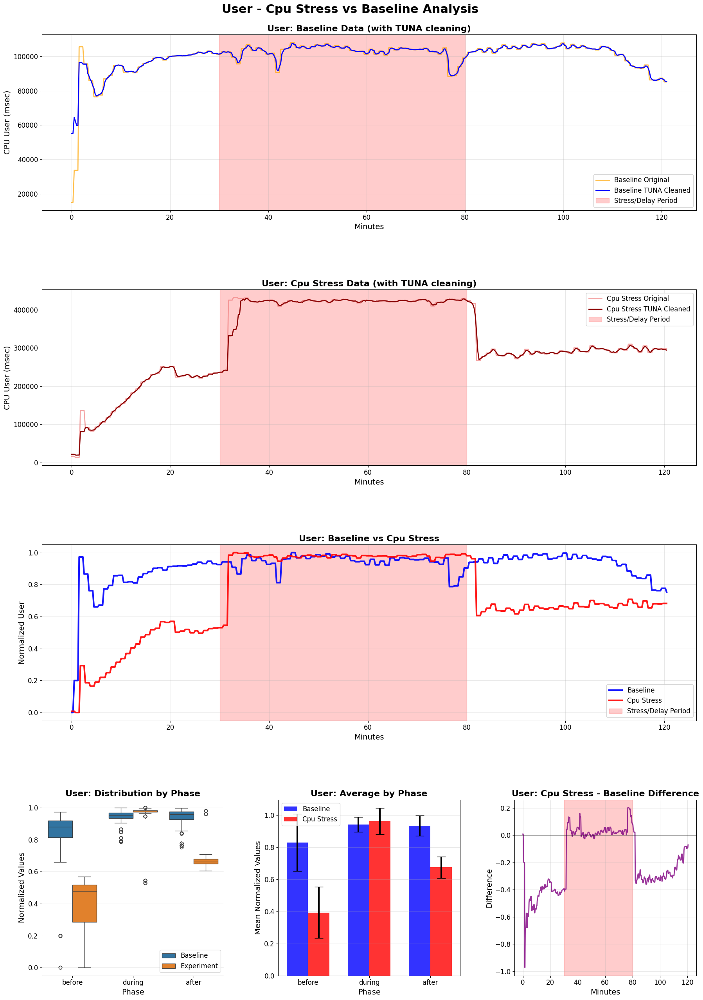


USER - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 197 outliers removed
    Noise Reduction: 0.6%, Correlation: 0.992
  BASELINE: 80 outliers removed
    Noise Reduction: 26.1%, Correlation: 0.950

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9346  0.0639  0.7534  0.9967
before  0.8292  0.1782  0.0000  0.9729
during  0.9422  0.0461  0.7877  1.0000

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.6751  0.0664  0.6065  0.9809
before  0.3940  0.1599  0.0000  0.5700
during  0.9637  0.0815  0.5307  1.0000

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 19.91, p=  0.0000 (SIGNIFICANT)
  DURING  : t= -3.26, p=  0.0012 (SIGNIFICANT)
  AFTER   : t= 35.84, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  :  -52.49% (DECREASE)
  DURING  :   +2.29% (INCREASE)
  AFTER   :  -27.77% (DECREASE)

📊 Comparing User: delay stress 

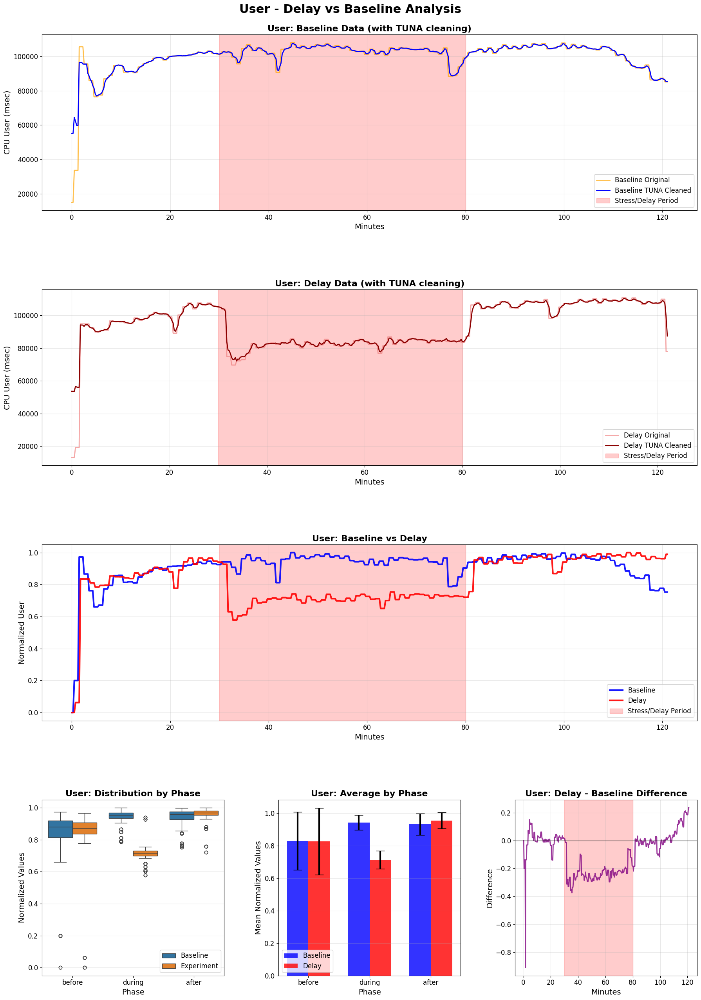


USER - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 169 outliers removed
    Noise Reduction: 18.0%, Correlation: 0.955
  BASELINE: 80 outliers removed
    Noise Reduction: 26.1%, Correlation: 0.950

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9324  0.0665  0.7534  0.9967
before  0.8292  0.1782  0.0000  0.9729
during  0.9422  0.0461  0.7877  1.0000

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9556  0.0493  0.7209  1.0000
before  0.8267  0.2053  0.0000  0.9660
during  0.7138  0.0552  0.5778  0.9399

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  0.10, p=  0.9194 (NOT SIGNIFICANT)
  DURING  : t= 45.01, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -3.58, p=  0.0004 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :   -0.30% (DECREASE)
  DURING  :  -24.24% (DECREASE)
  AFTER   :   +2.49% (INCREASE)

📊 Comparing User: mem_stress stress vs baselin

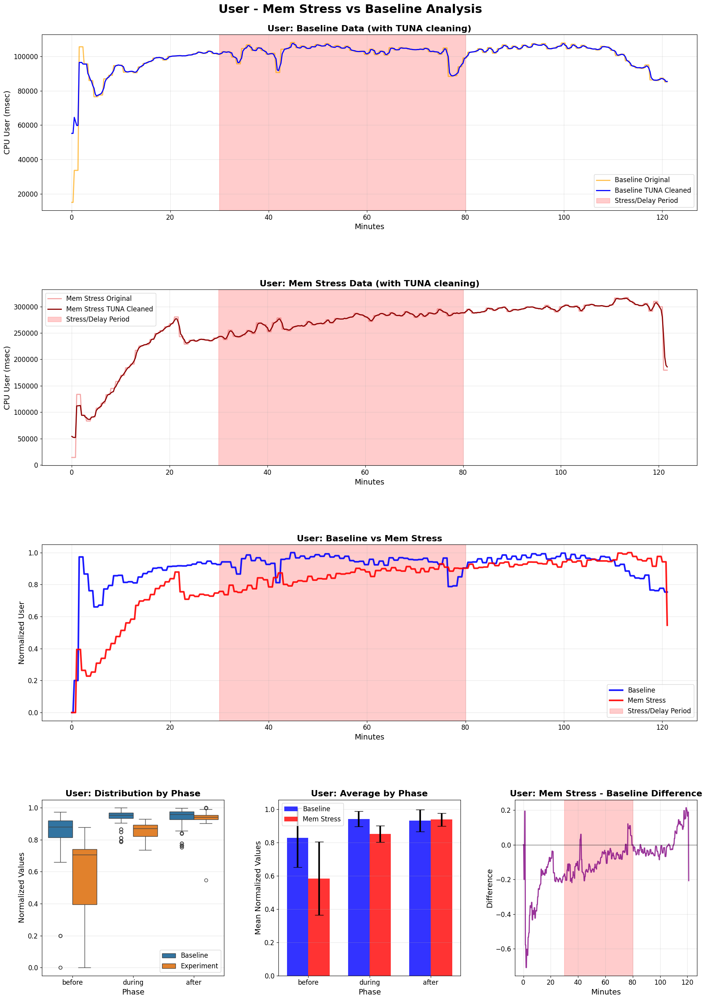


USER - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 98 outliers removed
    Noise Reduction: 2.1%, Correlation: 0.994
  BASELINE: 80 outliers removed
    Noise Reduction: 26.1%, Correlation: 0.950

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9324  0.0665  0.7534  0.9967
before  0.8292  0.1782  0.0000  0.9729
during  0.9422  0.0461  0.7877  1.0000

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9389  0.0389  0.5459  1.0000
before  0.5845  0.2212  0.0000  0.8786
during  0.8523  0.0494  0.7367  0.9296

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  9.43, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 18.86, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -1.08, p=  0.2828 (NOT SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  :  -29.50% (DECREASE)
  DURING  :   -9.54% (DECREASE)
  AFTER   :   +0.69% (INCREASE)

📊 Comparing User: net_loss s

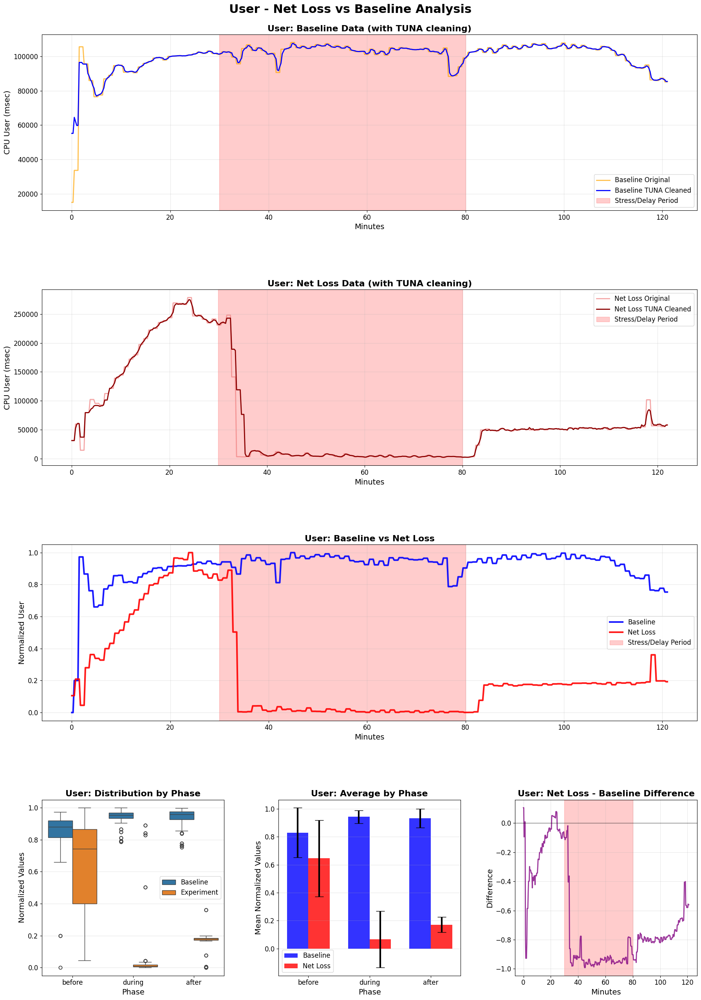


USER - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 274 outliers removed
    Noise Reduction: 0.4%, Correlation: 0.987
  BASELINE: 80 outliers removed
    Noise Reduction: 26.1%, Correlation: 0.950

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9324  0.0665  0.7534  0.9967
before  0.8292  0.1782  0.0000  0.9729
during  0.9422  0.0461  0.7877  1.0000

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.1707  0.0545  0.0007  0.3608
before  0.6458  0.2729  0.0453  1.0000
during  0.0668  0.2027  0.0000  0.8900

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  6.16, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 59.71, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=113.41, p=  0.0000 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  :  -22.11% (DECREASE)
  DURING  :  -92.91% (DECREASE)
  AFTER   :  -81.69% (DECREASE)

🔍 Analyzing Utilization...

📊 Comparing

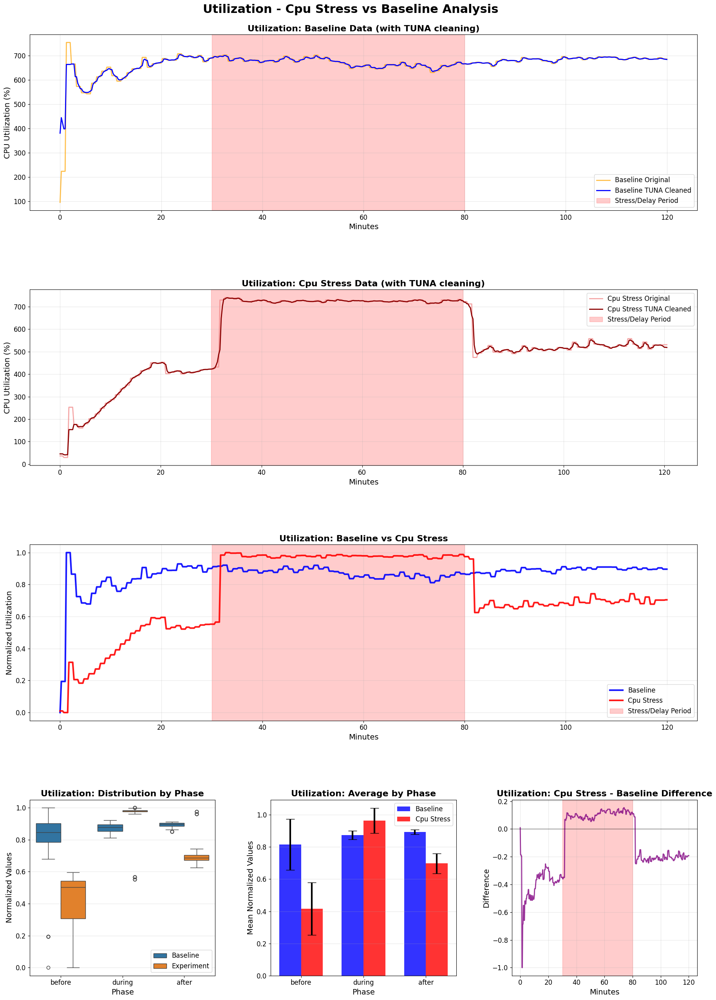


UTILIZATION - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 67 outliers removed
    Noise Reduction: -0.0%, Correlation: 0.995
  BASELINE: 72 outliers removed
    Noise Reduction: 32.4%, Correlation: 0.943

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.8925  0.0145  0.8499  0.9118
before  0.8153  0.1576  0.0000  1.0000
during  0.8744  0.0265  0.8122  0.9214

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.6982  0.0624  0.6253  0.9750
before  0.4159  0.1641  0.0000  0.5951
during  0.9645  0.0775  0.5525  1.0000

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 19.23, p=  0.0000 (SIGNIFICANT)
  DURING  : t=-15.61, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= 38.39, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  :  -48.99% (DECREASE)
  DURING  :  +10.31% (INCREASE)
  AFTER   :  -21.77% (DECREASE)

📊 Comparing Utilization:

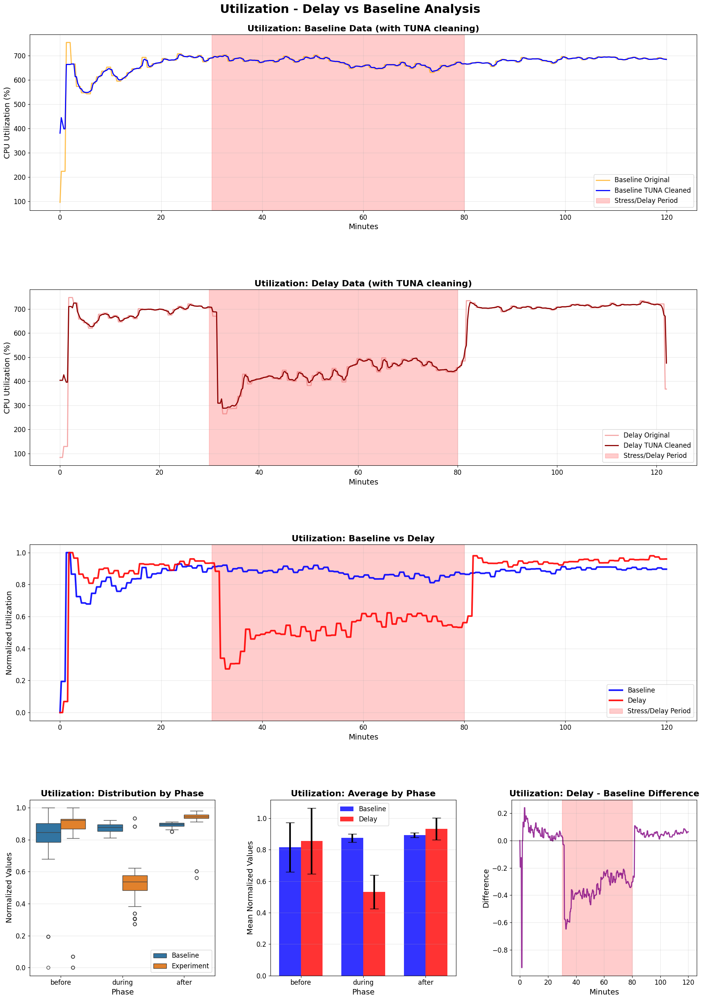


UTILIZATION - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 211 outliers removed
    Noise Reduction: 8.3%, Correlation: 0.964
  BASELINE: 72 outliers removed
    Noise Reduction: 32.4%, Correlation: 0.943

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.8925  0.0145  0.8499  0.9118
before  0.8153  0.1576  0.0000  1.0000
during  0.8744  0.0265  0.8122  0.9214

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9331  0.0698  0.5622  0.9803
before  0.8561  0.2086  0.0000  1.0000
during  0.5322  0.1080  0.2728  0.9348

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= -1.71, p=  0.0887 (NOT SIGNIFICANT)
  DURING  : t= 43.63, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -7.21, p=  0.0000 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :   +5.00% (INCREASE)
  DURING  :  -39.13% (DECREASE)
  AFTER   :   +4.55% (INCREASE)

📊 Comparing Utilization: mem_stress stre

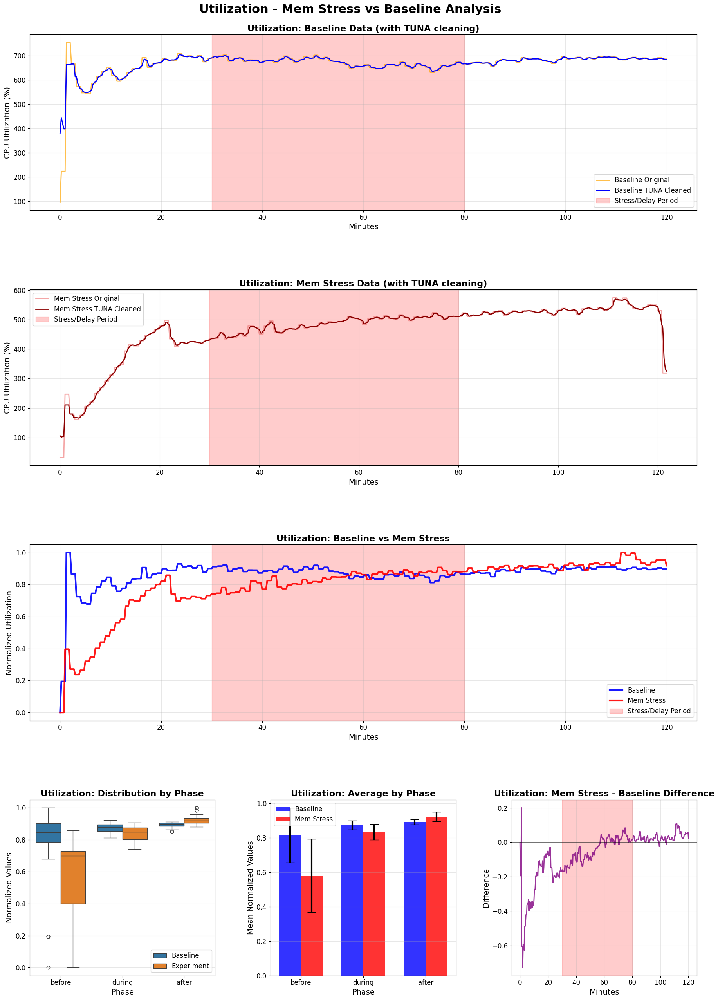


UTILIZATION - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 64 outliers removed
    Noise Reduction: 2.6%, Correlation: 0.992
  BASELINE: 72 outliers removed
    Noise Reduction: 32.4%, Correlation: 0.943

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.8925  0.0145  0.8499  0.9118
before  0.8153  0.1576  0.0000  1.0000
during  0.8744  0.0265  0.8122  0.9214

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9225  0.0277  0.8800  1.0000
before  0.5800  0.2127  0.0000  0.8583
during  0.8344  0.0460  0.7408  0.9074

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  9.74, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 10.68, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=-12.17, p=  0.0000 (SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  :  -28.86% (DECREASE)
  DURING  :   -4.57% (DECREASE)
  AFTER   :   +3.37% (INCREASE)

📊 Comparing Utilization: 

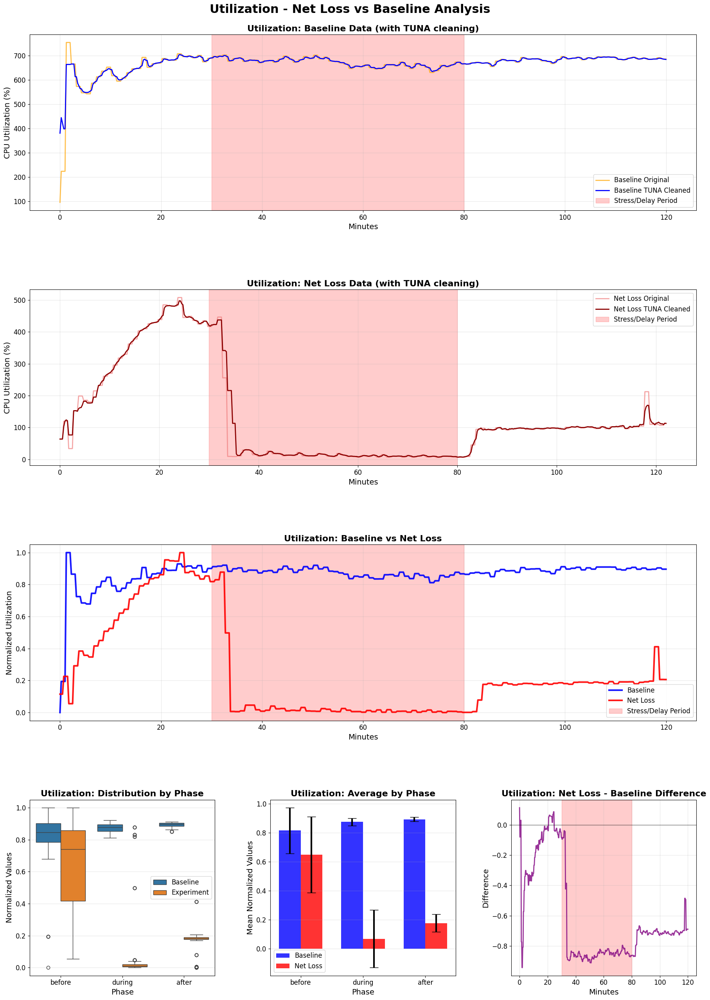


UTILIZATION - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 288 outliers removed
    Noise Reduction: 0.5%, Correlation: 0.988
  BASELINE: 72 outliers removed
    Noise Reduction: 32.4%, Correlation: 0.943

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.8925  0.0145  0.8499  0.9118
before  0.8153  0.1576  0.0000  1.0000
during  0.8744  0.0265  0.8122  0.9214

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.1760  0.0603  0.0010  0.4113
before  0.6481  0.2628  0.0555  1.0000
during  0.0679  0.1996  0.0000  0.8780

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  5.98, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 56.78, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=146.13, p=  0.0000 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  :  -20.51% (DECREASE)
  DURING  :  -92.23% (DECREASE)
  AFTER   :  -80.27% (DECREASE)


In [29]:
def calculate_cumulative_cpu(df):
    """Calculate total CPU from all CPU columns"""
    exclude_cols = ['Time', 'Minutes', 'source']
    cpu_cols = [col for col in df.columns if col not in exclude_cols]
    return df[cpu_cols].sum(axis=1).values

def normalize_series(series):
    """Normalize a series to 0-1 range"""
    min_val = series.min()
    max_val = series.max()
    if max_val > min_val:
        return (series - min_val) / (max_val - min_val)
    else:
        return pd.Series(np.zeros(len(series)), index=series.index)

def add_phase_column(df, delay_minutes=30, duration_minutes=50):
    """Add phase column based on experiment timeline"""
    df = df.copy()
    df['phase'] = 'before'
    df.loc[(df['Minutes'] >= delay_minutes) & (df['Minutes'] <= delay_minutes + duration_minutes), 'phase'] = 'during'
    df.loc[df['Minutes'] > delay_minutes + duration_minutes, 'phase'] = 'after'
    return df

def get_y_axis_label(metric_name):
    """Get appropriate y-axis label based on metric name"""
    labels = {
        'IOWait': 'CPU IOWait (msec)',
        'IRQ': 'CPU IRQ (msec)',
        'System': 'CPU System (msec)', 
        'User': 'CPU User (msec)',
        'Utilization': 'CPU Utilization (%)'
    }
    return labels.get(metric_name, 'Value')

def analyze_and_plot_metric_comparison(metric_name, experiment_name, experiment_df, baseline_df, 
                                     tuna_results=None, delay_minutes=30, duration_minutes=50):
    # Calculate cumulative metrics
    experiment_cumulative = calculate_cumulative_cpu(experiment_df)
    baseline_cumulative = calculate_cumulative_cpu(baseline_df)
    
    # Create series with proper index
    experiment_series = pd.Series(experiment_cumulative, index=experiment_df.index)
    baseline_series = pd.Series(baseline_cumulative, index=baseline_df.index)
    
    # Get TUNA cleaned data if available
    experiment_cleaned = None
    baseline_cleaned = None
    if tuna_results and metric_name in tuna_results:
        if experiment_name in tuna_results[metric_name]:
            experiment_cleaned = pd.Series(tuna_results[metric_name][experiment_name]['cleaned'])
        if 'baseline' in tuna_results[metric_name]:
            baseline_cleaned = pd.Series(tuna_results[metric_name]['baseline']['cleaned'])
    
    # Normalize data
    experiment_norm = normalize_series(experiment_series)
    baseline_norm = normalize_series(baseline_series)
    
    # Create combined dataframe for analysis
    min_length = min(len(experiment_norm), len(baseline_norm), len(experiment_df['Minutes']), len(baseline_df['Minutes']))
    
    df_combined = pd.DataFrame({
        'Baseline': baseline_norm.iloc[:min_length],
        'Experiment': experiment_norm.iloc[:min_length],
        'Minutes': experiment_df['Minutes'].iloc[:min_length],
        'Baseline_Minutes': baseline_df['Minutes'].iloc[:min_length]
    })
    
    df_combined['difference'] = df_combined['Experiment'] - df_combined['Baseline']
    
    # Add phase information
    df_combined['phase'] = 'before'
    df_combined.loc[(df_combined['Minutes'] >= delay_minutes) & 
                   (df_combined['Minutes'] <= delay_minutes + duration_minutes), 'phase'] = 'during'
    df_combined.loc[df_combined['Minutes'] > delay_minutes + duration_minutes, 'phase'] = 'after'
    
    # Statistical analysis by phase
    stats_baseline = df_combined.groupby('phase')['Baseline'].agg(['mean', 'std', 'min', 'max'])
    stats_experiment = df_combined.groupby('phase')['Experiment'].agg(['mean', 'std', 'min', 'max'])
    
    # T-tests for statistical significance
    t_tests = {}
    available_phases = stats_baseline.index.tolist()
    
    for phase in ['before', 'during', 'after']:
        if phase in available_phases:
            data = df_combined[df_combined['phase'] == phase]
            if len(data) > 1:
                t_stat, p_value = scipy_stats.ttest_ind(data['Baseline'].dropna(), data['Experiment'].dropna())
                t_tests[phase] = {'t': t_stat, 'p': p_value}
            else:
                t_tests[phase] = {'t': 0, 'p': 1}
        else:
            t_tests[phase] = {'t': 0, 'p': 1, 'note': 'Phase not present in data'}
    
    # Calculate percentage impact
    impact = {}
    for phase in ['before', 'during', 'after']:
        if phase in available_phases:
            baseline_mean = stats_baseline.loc[phase, 'mean']
            experiment_mean = stats_experiment.loc[phase, 'mean']
            if baseline_mean != 0:
                impact[phase] = ((experiment_mean - baseline_mean) / baseline_mean) * 100
            else:
                impact[phase] = 0
        else:
            impact[phase] = 0
    
    # Create the 6-plot visualization with first 3 plots on separate rows, last 3 on bottom row
    fig = plt.figure(figsize=(18, 26))  # Further reduced width, kept height
    
    # 1. Baseline with/without outlier cleaning - FULL WIDTH on Row 1
    plt.subplot(4, 1, 1)  # Full width centered subplot
    plt.plot(baseline_df['Minutes'], baseline_series, 
             label='Baseline Original', color='orange', alpha=0.7, linewidth=2)  # Increased linewidth
    
    if baseline_cleaned is not None:
        plt.plot(baseline_df['Minutes'].iloc[:len(baseline_cleaned)], baseline_cleaned, 
                 label='Baseline TUNA Cleaned', linewidth=2, color='blue')  # Thinner cleaned line
        title_suffix = " (with TUNA cleaning)"
    else:
        plt.plot(baseline_df['Minutes'], baseline_series, 
                 label='Baseline', linewidth=2, color='blue')  # Thinner cleaned line
        title_suffix = ""
    
    plt.axvspan(delay_minutes, delay_minutes + duration_minutes, 
                color='red', alpha=0.2, label="Stress/Delay Period")
    plt.title(f'{metric_name}: Baseline Data{title_suffix}', fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel('Minutes', fontsize=14)
    plt.ylabel(get_y_axis_label(metric_name), fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 2. Experiment with/without outlier cleaning - FULL WIDTH on Row 2
    plt.subplot(4, 1, 2)  # Full width centered subplot
    plt.plot(experiment_df['Minutes'], experiment_series, 
             label=f'{experiment_name.replace("_", " ").title()} Original', 
             alpha=0.7, color='lightcoral', linewidth=2)  # Increased linewidth
    
    if experiment_cleaned is not None:
        plt.plot(experiment_df['Minutes'].iloc[:len(experiment_cleaned)], experiment_cleaned, 
                 label=f'{experiment_name.replace("_", " ").title()} TUNA Cleaned', 
                 linewidth=2, color='darkred')  # Thinner cleaned line
        title_suffix = " (with TUNA cleaning)"
    else:
        plt.plot(experiment_df['Minutes'], experiment_series, 
                 label=f'{experiment_name.replace("_", " ").title()}', 
                 linewidth=2, color='darkred')  # Thinner cleaned line
        title_suffix = ""
    
    plt.axvspan(delay_minutes, delay_minutes + duration_minutes, 
                color='red', alpha=0.2, label="Stress/Delay Period")
    plt.title(f'{metric_name}: {experiment_name.replace("_", " ").title()} Data{title_suffix}', 
              fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel('Minutes', fontsize=14)
    plt.ylabel(get_y_axis_label(metric_name), fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 3. Timeline comparison (normalized) - FULL WIDTH on Row 3
    plt.subplot(4, 1, 3)  # Full width centered subplot
    plt.plot(df_combined['Minutes'], df_combined['Baseline'], 
             label='Baseline', linewidth=3, color='blue', alpha=0.9)  # Slightly thinner
    plt.plot(df_combined['Minutes'], df_combined['Experiment'], 
             label=f'{experiment_name.replace("_", " ").title()}', linewidth=3, color='red', alpha=0.9)  # Slightly thinner
    plt.axvspan(delay_minutes, delay_minutes + duration_minutes, 
                color='red', alpha=0.2, label="Stress/Delay Period")
    plt.title(f"{metric_name}: Baseline vs {experiment_name.replace('_', ' ').title()}", 
              fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel("Minutes", fontsize=14)
    plt.ylabel(f"Normalized {metric_name}", fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=12)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 4. Box plot by phase - Bottom row, first plot
    plt.subplot(4, 3, 10)  # Row 4, column 1
    box_data = pd.melt(df_combined[['Baseline', 'Experiment', 'phase']], 
                      id_vars=['phase'], var_name='source', value_name='value')
    sns.boxplot(x='phase', y='value', hue='source', data=box_data, ax=plt.gca())
    plt.title(f'{metric_name}: Distribution by Phase', fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel('Phase', fontsize=14)
    plt.ylabel('Normalized Values', fontsize=14)
    plt.grid(axis='y', alpha=0.3)
    plt.legend(fontsize=12)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 5. Statistics by phase - Bottom row, second plot
    plt.subplot(4, 3, 11)  # Row 4, column 2
    phases_to_plot = [p for p in ['before', 'during', 'after'] if p in available_phases]
    
    if len(phases_to_plot) > 0:
        x = np.arange(len(phases_to_plot))
        width = 0.35
        
        baseline_means = [stats_baseline.loc[p, 'mean'] for p in phases_to_plot]
        baseline_stds = [stats_baseline.loc[p, 'std'] for p in phases_to_plot]
        experiment_means = [stats_experiment.loc[p, 'mean'] for p in phases_to_plot]
        experiment_stds = [stats_experiment.loc[p, 'std'] for p in phases_to_plot]
        
        bars1 = plt.bar(x - width/2, baseline_means, width, 
                       label='Baseline', alpha=0.8, color='blue')
        bars2 = plt.bar(x + width/2, experiment_means, width, 
                       label=f'{experiment_name.replace("_", " ").title()}', alpha=0.8, color='red')
        
        plt.errorbar(x - width/2, baseline_means, yerr=baseline_stds, 
                    fmt='none', ecolor='black', capsize=8, linewidth=3)  # Increased capsize and linewidth
        plt.errorbar(x + width/2, experiment_means, yerr=experiment_stds, 
                    fmt='none', ecolor='black', capsize=8, linewidth=3)  # Increased capsize and linewidth
        
        plt.xticks(x, phases_to_plot)
    else:
        plt.text(0.5, 0.5, 'No phase data available', ha='center', va='center', 
                transform=plt.gca().transAxes, fontsize=14)
    
    plt.title(f'{metric_name}: Average by Phase', fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel('Phase', fontsize=14)
    plt.ylabel('Mean Normalized Values', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(axis='y', alpha=0.3)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 6. Difference over time - Bottom row, third plot
    plt.subplot(4, 3, 12)  # Row 4, column 3
    plt.plot(df_combined['Minutes'], df_combined['difference'], 
             color='purple', linewidth=2, alpha=0.8)  # Thinner line
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.5, linewidth=1)  # Thinner reference line
    plt.axvspan(delay_minutes, delay_minutes + duration_minutes, 
                color='red', alpha=0.2)
    plt.title(f'{metric_name}: {experiment_name.replace("_", " ").title()} - Baseline Difference', 
              fontsize=16, fontweight='bold')  # Increased fontsize
    plt.xlabel('Minutes', fontsize=14)  # Increased fontsize
    plt.ylabel('Difference', fontsize=14)  # Increased fontsize
    plt.grid(True, alpha=0.3)
    plt.tick_params(axis='both', which='major', labelsize=12)  # Increased tick label size
    
    plt.suptitle(f'{metric_name} - {experiment_name.replace("_", " ").title()} vs Baseline Analysis', 
                fontsize=22, fontweight='bold', y=0.98)  # Keep large title
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, hspace=0.45, wspace=0.3)  # More vertical spacing for higher plots
    plt.show()
    
    # Print statistical results
    print(f"\n{'='*80}")
    print(f"{metric_name.upper()} - {experiment_name.upper().replace('_', ' ')} VS BASELINE ANALYSIS")
    print(f"{'='*80}")
    
    # Print TUNA cleaning summary if available
    if tuna_results and metric_name in tuna_results:
        print(f"\nTUNA CLEANING SUMMARY:")
        if experiment_name in tuna_results[metric_name]:
            exp_stats = tuna_results[metric_name][experiment_name]['stats']
            print(f"  {experiment_name.upper().replace('_', ' ')}: {exp_stats['outliers']} outliers removed")
            print(f"    Noise Reduction: {exp_stats['noise_reduction']:.1f}%, Correlation: {exp_stats['correlation']:.3f}")
        
        if 'baseline' in tuna_results[metric_name]:
            base_stats = tuna_results[metric_name]['baseline']['stats']
            print(f"  BASELINE: {base_stats['outliers']} outliers removed")
            print(f"    Noise Reduction: {base_stats['noise_reduction']:.1f}%, Correlation: {base_stats['correlation']:.3f}")
    
    print(f"\nBASELINE STATISTICS BY PHASE:")
    if len(stats_baseline) > 0:
        print(stats_baseline.round(4))
    else:
        print("  No phase data available")
    
    print(f"\n{experiment_name.upper().replace('_', ' ')} STATISTICS BY PHASE:")
    if len(stats_experiment) > 0:
        print(stats_experiment.round(4))
    else:
        print("  No phase data available")
    
    print(f"\nSTATISTICAL SIGNIFICANCE TESTS:")
    for phase, test in t_tests.items():
        if 'note' in test:
            print(f"  {phase.upper():8}: {test['note']}")
        else:
            sig = "SIGNIFICANT" if test['p'] < 0.05 else "NOT SIGNIFICANT"
            print(f"  {phase.upper():8}: t={test['t']:6.2f}, p={test['p']:8.4f} ({sig})")
    
    print(f"\n{experiment_name.upper().replace('_', ' ')} IMPACT:")
    for phase, change in impact.items():
        if change == 0 and phase not in available_phases:
            print(f"  {phase.upper():8}: Phase not present in data")
        else:
            direction = "INCREASE" if change > 0 else "DECREASE" if change < 0 else "NO CHANGE"
            print(f"  {phase.upper():8}: {change:+7.2f}% ({direction})")
    
    return {
        'stats_baseline': stats_baseline,
        'stats_experiment': stats_experiment,
        't_tests': t_tests,
        'impact': impact,
        'combined_data': df_combined
    }

def run_comprehensive_metric_analysis(all_datasets, tuna_results=None):
    """
    Run comprehensive analysis for all metrics against their baselines
    """
    print(f"\n{'='*80}")
    print("COMPREHENSIVE CPU METRIC ANALYSIS")
    print(f"{'='*80}")
    print("Each CPU metric will be compared to its own baseline")
    
    analysis_results = {}
    
    for metric_name, experiments in all_datasets.items():
        print(f"\n🔍 Analyzing {metric_name}...")
        analysis_results[metric_name] = {}
        
        baseline_df = experiments['baseline']
        
        for experiment_name, experiment_df in experiments.items():
            if experiment_name != 'baseline':
                print(f"\n📊 Comparing {metric_name}: {experiment_name} stress vs baseline")
                
                result = analyze_and_plot_metric_comparison(
                    metric_name=metric_name,
                    experiment_name=experiment_name,
                    experiment_df=experiment_df,
                    baseline_df=baseline_df,
                    tuna_results=tuna_results
                )
                
                analysis_results[metric_name][experiment_name] = result
    
    return analysis_results

# Run comprehensive analysis using existing tuna_results from previous cell
results = run_comprehensive_metric_analysis(all_datasets, tuna_results)

# Or analyze a specific metric-experiment combination:
# specific_result = analyze_and_plot_metric_comparison(
#     metric_name='IOWait',
#     experiment_name='cpu_stress', 
#     experiment_df=all_datasets['IOWait']['cpu_stress'],
#     baseline_df=all_datasets['IOWait']['baseline'],
#     tuna_results=tuna_results
# )